# Notebook Workflow:



1. Installing and importing libraries
2. Loading and Diagnosing the data
3. Filtering and understanding Data
4. Preprocessing the data
5. Pandas Profiling
6. Exploratory Data Analysis of data to understand its correlations
7. Classification
8. Feature Engineering 
9. Feature Selection
10. Model Building
11. Model Training and Testing
12. Ensemble ML - Classification
13. Model Evalution 
14. Observation/Conclusion
15. Regression
16. Feature Engineering 
17. Feature Selection
18. Model Building
19. Model Training and Testing
20. Ensemble ML - Regression
21. Model Evalution
22. Observation/Conclusion

----

# Assignment Contributors

1. Ashique Zzaman (2021SC04612)  

# 1. Installing Packages

In [1]:
!pip install pandas-profiling --user

In [2]:
!pip install lightgbm --user

In [3]:
!pip install imbalanced-learn==0.8.0 --user

In [4]:
!pip install xgboost --user

In [5]:
!pip install lime --user

In [6]:
!pip install ruamel_yaml --user

In [7]:
!pip install eli5 --user

In [8]:
!pip install shap --user

# 2. Importing Libraries

In [123]:
# importing modules

import numpy as np
import pandas as pd
import seaborn as sns
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport

# importing imblearn libraries
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# importing sklearn libraries
from sklearn import tree
from sklearn import neighbors
from sklearn.svm import SVR, SVC
from sklearn.naive_bayes import GaussianNB
from sklearn import preprocessing, linear_model
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV,  cross_val_score
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, export_graphviz
from sklearn.linear_model import Ridge, Lasso, LinearRegression, LogisticRegression, SGDRegressor
from sklearn.ensemble import (RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor,
                              RandomForestClassifier, StackingRegressor, BaggingRegressor,
                              GradientBoostingClassifier,AdaBoostClassifier)
from sklearn.metrics import (mean_squared_error, mean_absolute_error, r2_score, accuracy_score, classification_report,
                             r2_score, mean_squared_error, accuracy_score, classification_report, confusion_matrix,
                             accuracy_score)
from sklearn.preprocessing import (StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder, LabelEncoder, StandardScaler,
                                   MinMaxScaler, RobustScaler, PowerTransformer, PolynomialFeatures)

# importing model explainability libraries
import lime
import shap
import eli5 as eli
from lime import lime_tabular


import warnings
warnings.filterwarnings('ignore')

pd.pandas.set_option('display.max_columns',None)
%matplotlib inline

# 3. Reading and understanding Data

Creating a Pandas dataframe using the source file, to view and analyze the data.

In [10]:
# Reading the csv file

df_bike=pd.read_csv("SeoulBikeData.csv", encoding= 'unicode_escape')


In [11]:
# Shape and Datatypes

print(df_bike.shape)
print(df_bike.info())

(8760, 14)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-n

In [12]:
# Showing sample data

df_bike.head(5)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [13]:
# Showing Datatype, Unique values and Null values

def data_info():
    temp_ps = pd.DataFrame(index=df_bike.columns)
    temp_ps['DataType'] = df_bike.dtypes
    temp_ps["Non-null_Values"] = df_bike.count()
    temp_ps['Unique_Values'] = df_bike.nunique()
    temp_ps['NaN_Values'] = df_bike.isnull().sum()
    temp_ps['NaN_Values_Percentage'] = (temp_ps['NaN_Values']/len(df_bike))*100 
    return temp_ps

data_info()

,DataType,Non-null_Values,Unique_Values,NaN_Values,NaN_Values_Percentage
Date,object,8760,365,0,0.0
Rented Bike Count,int64,8760,2166,0,0.0
Hour,int64,8760,24,0,0.0
Temperature(°C),float64,8760,546,0,0.0
Humidity(%),int64,8760,90,0,0.0
Wind speed (m/s),float64,8760,65,0,0.0
Visibility (10m),int64,8760,1789,0,0.0
Dew point temperature(°C),float64,8760,556,0,0.0
Solar Radiation (MJ/m2),float64,8760,345,0,0.0
Rainfall(mm),float64,8760,61,0,0.0


Observations from data:

1. There are 14 features with 8760 rows of data.
2. There are 4 categorical columns and 10 numerical columns. Columns ‘Date’, ‘Seasons’ and ‘Functioning Day’ are of 𝑜𝑏𝑗𝑒𝑐𝑡 data type
3. Columns ‘Rented Bike Count’, ‘Hour’, ‘Humidity (%)' and ‘Visibility (10𝑚)' are of 𝑖𝑛𝑡64 numarical data type
4. Columns ‘Temperature Temperature (℃)’, ‘Wind Speed (𝑚/𝑠)’, ‘Dew Point Temperature (℃)’,‘Solar Radiation (𝑀𝐽/𝑚2)’,‘Rainfall (𝑚𝑚)' and ‘Snowfall(𝑐𝑚) are of 𝑓𝑙𝑜𝑎𝑡64 numarical data type
5. Not any null value present in any column
6. Unique count : Seasons- 4 , Holiday- 2 , Functioning Day- 2

# 4. Preprocessing the data

In [14]:
# Statistical information

df_bike.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,8760,365,01/12/2017,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rented Bike Count,8760.0,NaN,NaN,NaN,704.602055,644.997468,0.0,191.0,504.5,1065.25,3556.0
Hour,8760.0,NaN,NaN,NaN,11.5,6.922582,0.0,5.75,11.5,17.25,23.0
Temperature(°C),8760.0,NaN,NaN,NaN,12.882922,11.944825,-17.8,3.5,13.7,22.5,39.4
Humidity(%),8760.0,NaN,NaN,NaN,58.226256,20.362413,0.0,42.0,57.0,74.0,98.0
Wind speed (m/s),8760.0,NaN,NaN,NaN,1.724909,1.0363,0.0,0.9,1.5,2.3,7.4
Visibility (10m),8760.0,NaN,NaN,NaN,1436.825799,608.298712,27.0,940.0,1698.0,2000.0,2000.0
Dew point temperature(°C),8760.0,NaN,NaN,NaN,4.073813,13.060369,-30.6,-4.7,5.1,14.8,27.2
Solar Radiation (MJ/m2),8760.0,NaN,NaN,NaN,0.569111,0.868746,0.0,0.0,0.01,0.93,3.52
Rainfall(mm),8760.0,NaN,NaN,NaN,0.148687,1.128193,0.0,0.0,0.0,0.0,35.0


The ranges of values in the numerical columns seem reasonable too, so we may not have to do much data cleaning. The "Wind speed","Dew point temperature(°C)", "Solar Radiation", "Rainfall" and "Snowfall" column seems to be significantly skewed however, as the median (50 percentile) is much lower than the maximum value.

In [15]:
# Checking Null values of data 

df_bike.isna().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [16]:
# Checking duplicate

df_bike.duplicated().sum()

0

In [17]:
# Converting date column dtype object to date 

df_bike['Date']=pd.to_datetime(df_bike['Date'])

In [18]:
# Spliting Date column into 3 columns - day of week, month and year

df_bike["day_of_week"] = df_bike['Date'].dt.day_name() # extract week name from Date column
df_bike["month"] = df_bike['Date'].dt.month_name()   # extract month name from Date column
df_bike["year"] = df_bike['Date'].map(lambda x: x.year).astype("object")     # extract year from Date column and convert it in object type 

In [19]:
# Dropping the Date column

df_bike.drop(columns=['Date'],inplace=True)

On observing the data it can be seen that Hour column is a numerical column but it is a time stamp so we need to treat Hour as a categorical feature


In [20]:
# Converting Hour column integer to Categorical

df_bike['Hour']=df_bike['Hour'].astype('object')

In [21]:
# Dividing Data in categorical and numerical features

num_features = df_bike.select_dtypes(exclude='object')
cat_features = df_bike.select_dtypes(include='object')

### Pandas Profiling

In [22]:
profile = ProfileReport(df_bike, title="Pandas Profiling Report")

In [23]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

# 5. Exploratory data analysis

### Categorical Features -

In [25]:
cat_features.head()

,Hour,Seasons,Holiday,Functioning Day,day_of_week,month,year
0,0,Winter,No Holiday,Yes,Thursday,January,2017
1,1,Winter,No Holiday,Yes,Thursday,January,2017
2,2,Winter,No Holiday,Yes,Thursday,January,2017
3,3,Winter,No Holiday,Yes,Thursday,January,2017
4,4,Winter,No Holiday,Yes,Thursday,January,2017


In [26]:
# Checking categorical column value count

for i in cat_features.columns:
  print("\n ")
  print('column name : ', i)
  print(df_bike[i].value_counts())


 
column name :  Hour
0     365
1     365
22    365
21    365
20    365
19    365
18    365
17    365
16    365
15    365
14    365
13    365
12    365
11    365
10    365
9     365
8     365
7     365
6     365
5     365
4     365
3     365
2     365
23    365
Name: Hour, dtype: int64

 
column name :  Seasons
Spring    2208
Summer    2208
Autumn    2184
Winter    2160
Name: Seasons, dtype: int64

 
column name :  Holiday
No Holiday    8328
Holiday        432
Name: Holiday, dtype: int64

 
column name :  Functioning Day
Yes    8465
No      295
Name: Functioning Day, dtype: int64

 
column name :  day_of_week
Sunday       1296
Wednesday    1272
Tuesday      1272
Thursday     1248
Saturday     1248
Friday       1224
Monday       1200
Name: day_of_week, dtype: int64

 
column name :  month
January      744
March        744
May          744
July         744
August       744
October      744
December     744
April        720
June         720
September    720
November     720
February     

Exploring the categorical feature and fetching some important information from the categorical feature

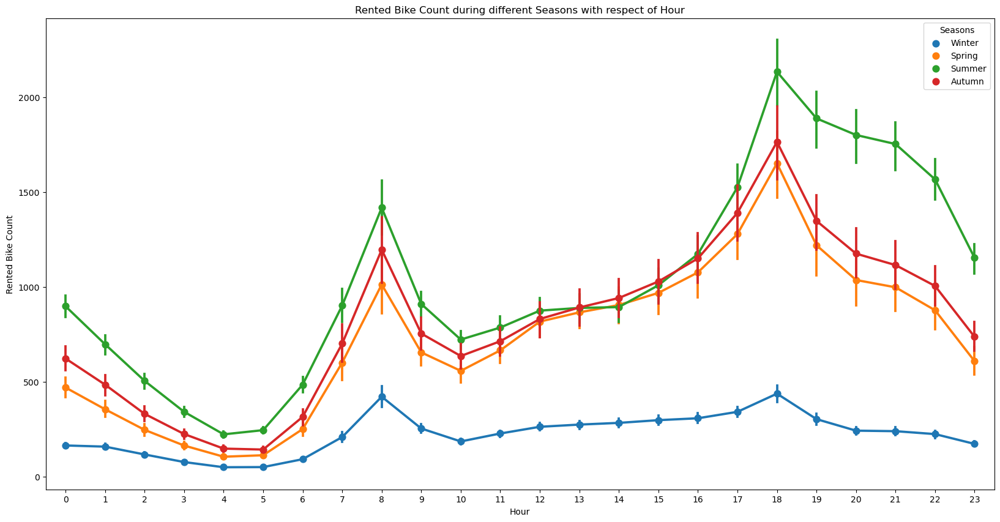

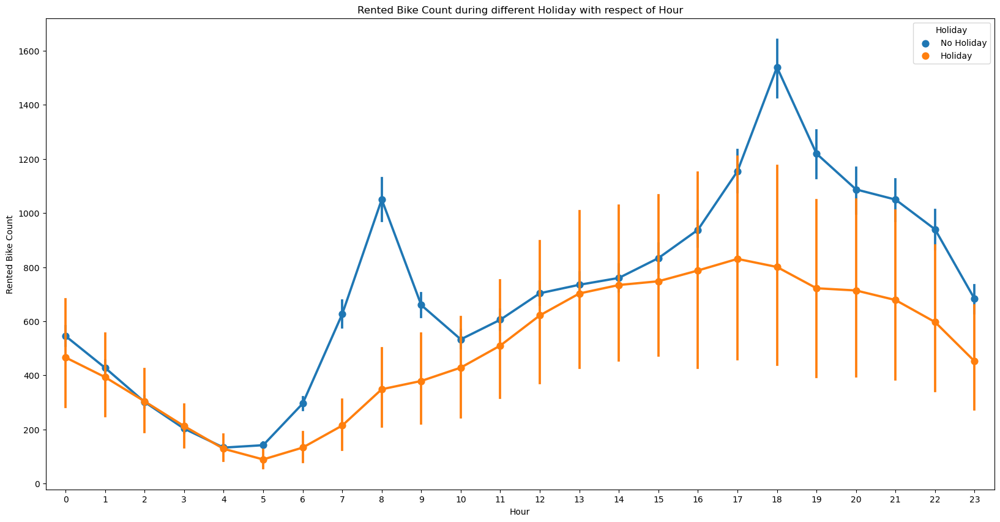

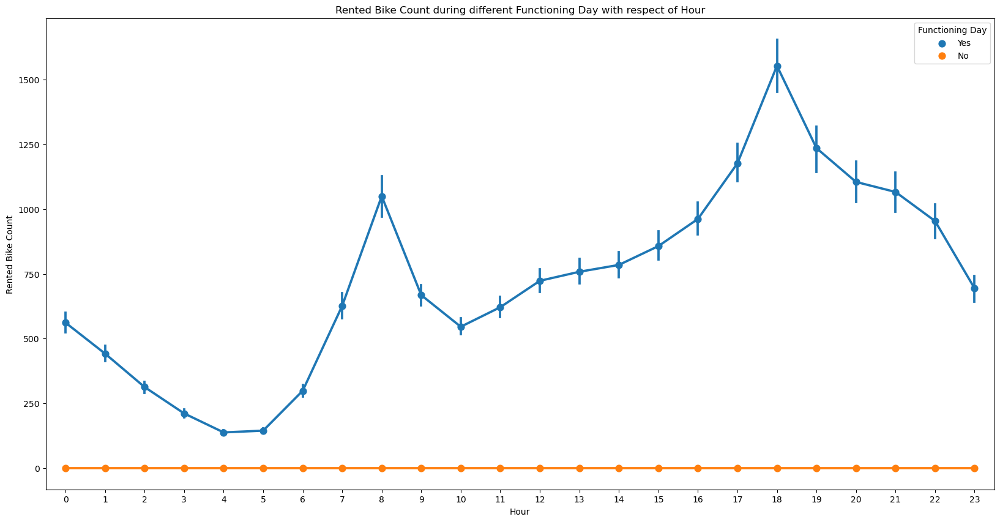

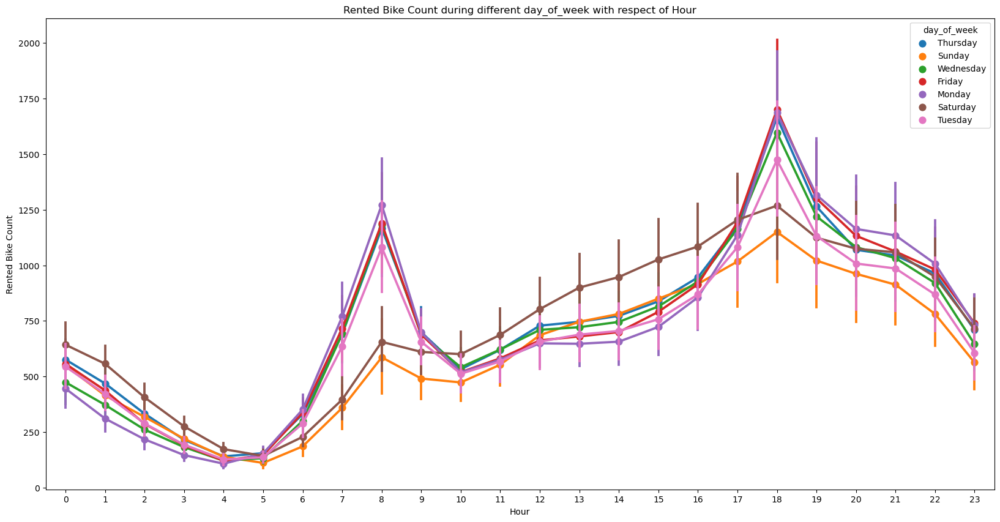

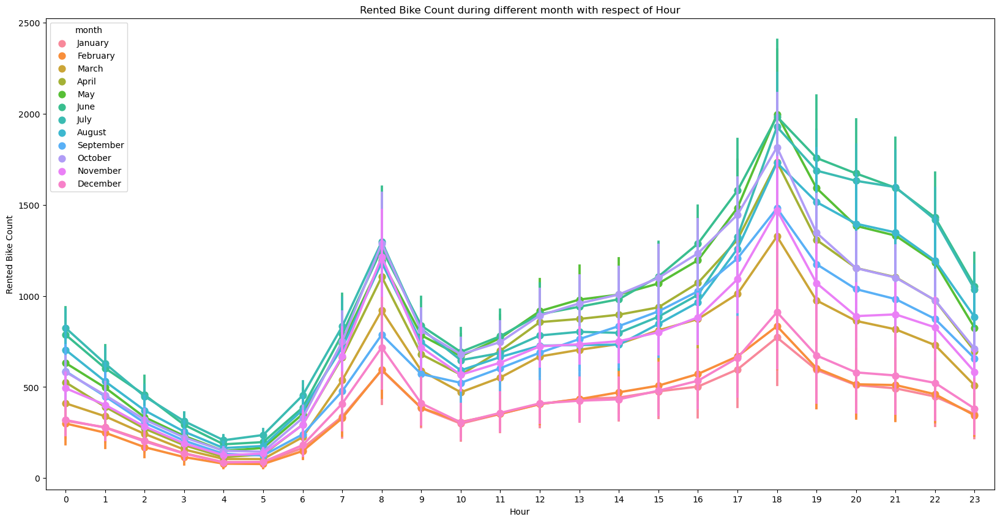

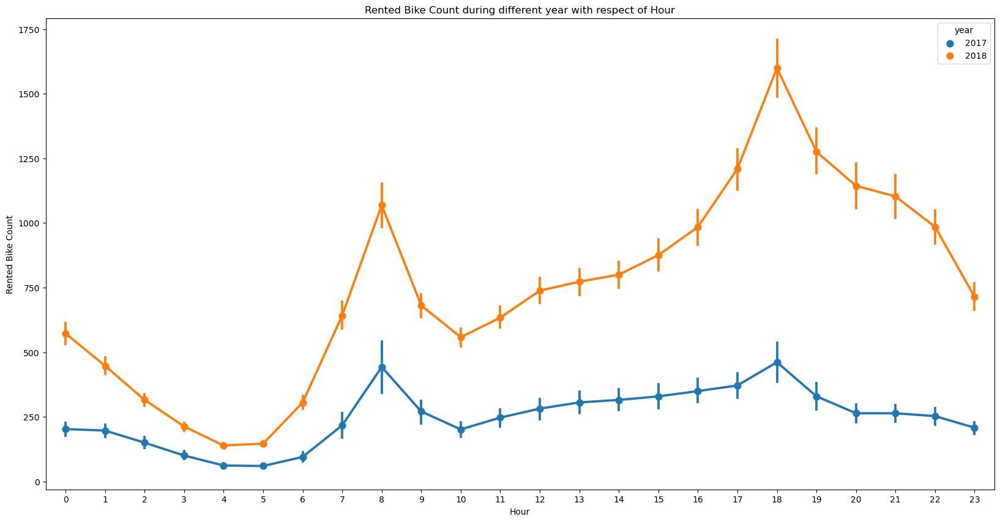

In [27]:
# Creating point plots with Rented Bike Count during different categorical features with respect of Hour

for i in cat_features.columns:
  if i == 'Hour':
    pass
  else:
    plt.figure(figsize=(20,10))
    sns.pointplot(x=df_bike["Hour"], y=df_bike['Rented Bike Count'], hue=df_bike[i])
    plt.title(f"Rented Bike Count during different {i} with respect of Hour")
  plt.show()

Observations:

From all these pointplot we have observed below from columns -

1. Seasons - The demand is low in the winter season.

2. Holiday - The demand is low during holidays, but in non holidays the demand is high, it may be due to reason that people use bikes to go to their workplace.

3. Functioning Day - There is no demand in non Functioning Day

4. day_of_week - There is different pattern for weekdays and weekends, in the weekend the demand becomes high in the afternoon. While the demand for office timings is high during weekdays, hence, we can change this column to weekdays and weekends.

5. month - The demand is low in December January & February, It is cold in these months and we have already seen in season column that demand is less in winters.

6. year - The demand was less in 2017 and higher in 2018, it may be due to reason that it was new in 2017 and people did not know much about it.

In [28]:
# Converting days of weeks in 2 variable from Monday to Friday to Weekdays and Saturday and Sunday to Weekend

df_bike['week'] = df_bike['day_of_week'].apply(lambda x:'Weekend'  if x =='Saturday' or  x == 'Sunday' else 'Weekdays')

In [29]:
# Value counts of Week column

df_bike.week.value_counts()

Weekdays    6216
Weekend     2544
Name: week, dtype: int64

Text(0.5, 1.0, 'Rented Bike Count during weekday and weekend with respect of Hour')

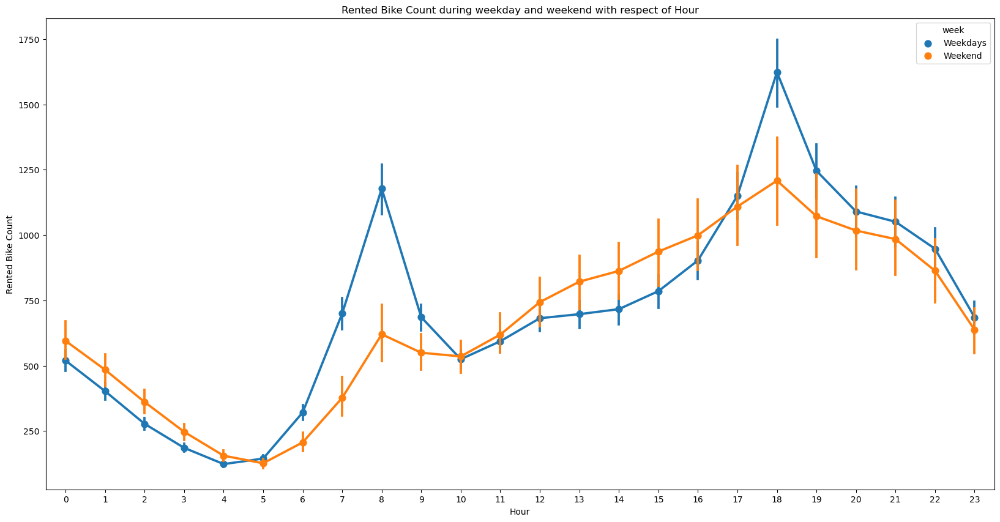

In [30]:
# Revised pointplot for week column  

plt.figure(figsize=(20,10))
sns.pointplot(x=df_bike["Hour"], y=df_bike['Rented Bike Count'], hue=df_bike['week'])
plt.title("Rented Bike Count during weekday and weekend with respect of Hour")

The above pattern shows that the demand is high in the afternoon on the weekend. While there is more demand during office hours in weekdays

In [31]:
# Dropping the days_of_week column from dataframe and from categorical feature 

df_bike.drop(columns=['day_of_week'], inplace=True)
cat_features.drop(columns=['day_of_week'], inplace=True)

In [32]:
# Looping and getting all value counts of categorical features in percentage

for i in cat_features.columns:
  print('feature name : ',i)
  print(df_bike[i].value_counts(normalize=True))
  print('\n')

feature name :  Hour
0     0.041667
1     0.041667
22    0.041667
21    0.041667
20    0.041667
19    0.041667
18    0.041667
17    0.041667
16    0.041667
15    0.041667
14    0.041667
13    0.041667
12    0.041667
11    0.041667
10    0.041667
9     0.041667
8     0.041667
7     0.041667
6     0.041667
5     0.041667
4     0.041667
3     0.041667
2     0.041667
23    0.041667
Name: Hour, dtype: float64


feature name :  Seasons
Spring    0.252055
Summer    0.252055
Autumn    0.249315
Winter    0.246575
Name: Seasons, dtype: float64


feature name :  Holiday
No Holiday    0.950685
Holiday       0.049315
Name: Holiday, dtype: float64


feature name :  Functioning Day
Yes    0.966324
No     0.033676
Name: Functioning Day, dtype: float64


feature name :  month
January      0.084932
March        0.084932
May          0.084932
July         0.084932
August       0.084932
October      0.084932
December     0.084932
April        0.082192
June         0.082192
September    0.082192
November  



======================================== Hour ========================================




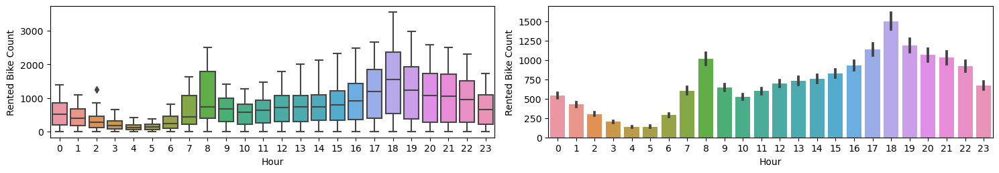



======================================== Seasons ========================================




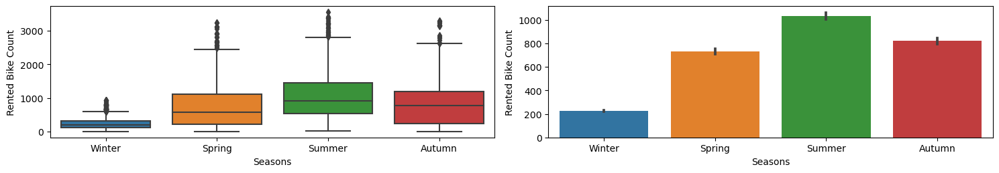



======================================== Holiday ========================================




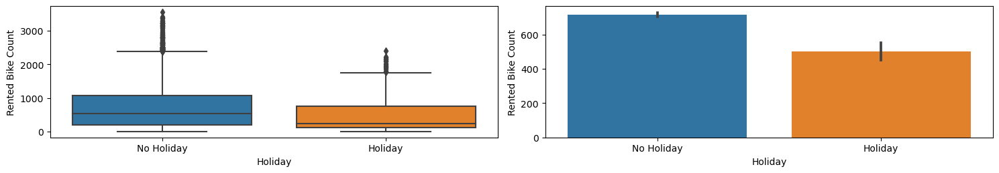



======================================== Functioning Day ========================================




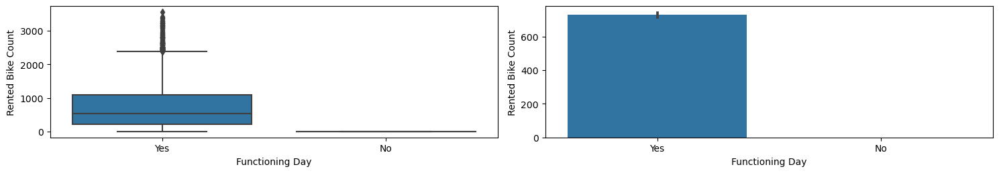



======================================== month ========================================




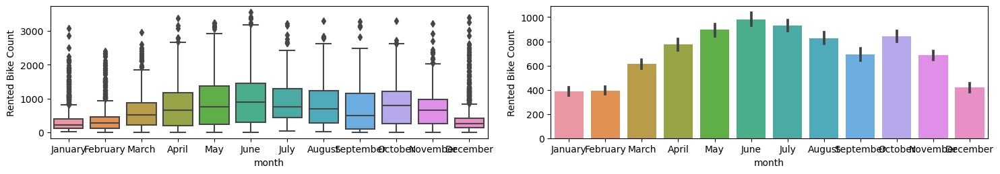



======================================== year ========================================




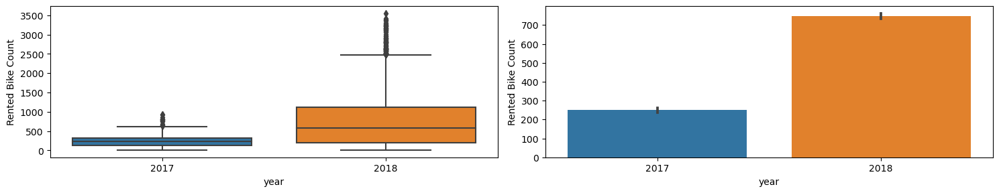

In [33]:
# Visualization of value counts by creating boxplot plot and bar plot

n=1
for i in cat_features.columns:
  plt.figure(figsize=(15,15))
  plt.subplot(6,2,n)
  n+=1
  print('\n')
  print('='*40,i,'='*40)
  print('\n')
  sns.boxplot(x=df_bike[i], y=df_bike["Rented Bike Count"])
  plt.subplot(6,2,n)
  n+= 1
  sns.barplot(df_bike[i], df_bike['Rented Bike Count'])
  plt.tight_layout()
  plt.show()

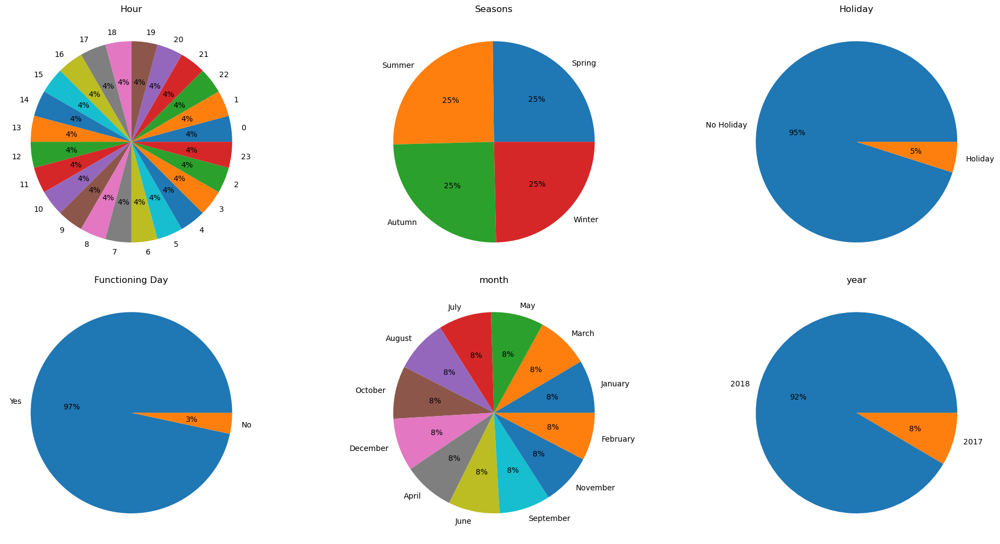

In [34]:
# Creating Pieplot for all categorical features

n=1
plt.figure(figsize=(20,15))
for i in cat_features.columns:
  plt.subplot(3,3,n)
  n=n+1
  plt.pie(df_bike[i].value_counts(),labels = df_bike[i].value_counts().keys().tolist(),autopct='%.0f%%')
  plt.title(i)
  plt.tight_layout()

### Numerical Features -

In [35]:
num_features.head()

,Rented Bike Count,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
0,254,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,204,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0
2,173,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0
3,107,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0
4,78,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0


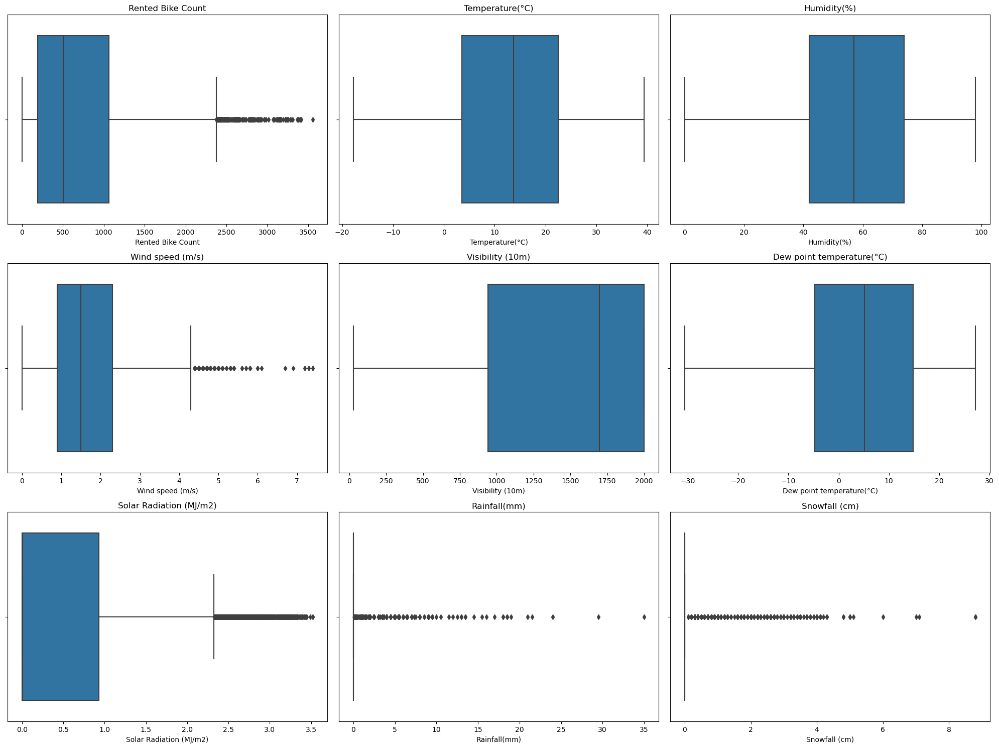

In [36]:
# checking Outliers with seaborn boxplot
n = 1
plt.figure(figsize=(20,15))

for i in num_features.columns:
  plt.subplot(3,3,n)
  n=n+1
  sns.boxplot(df_bike[i])
  plt.title(i)
  plt.tight_layout()

However, We do not need to worry about outliers in this data, because when we are treating the outlires from Rainfall and Snowfall columns using Inter Quartile Range (IQR) it removed all the information of the data and all values became 0



======================================== Rented Bike Count ========================================




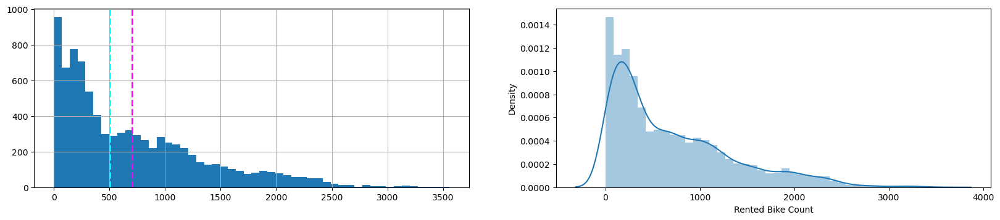



======================================== Temperature(°C) ========================================




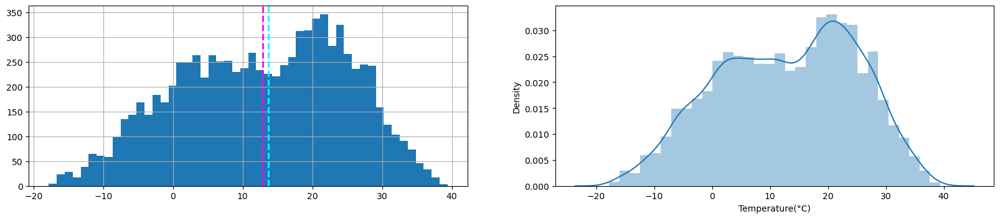



======================================== Humidity(%) ========================================




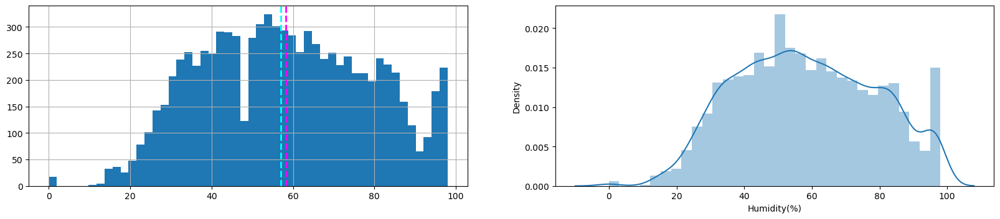



======================================== Wind speed (m/s) ========================================




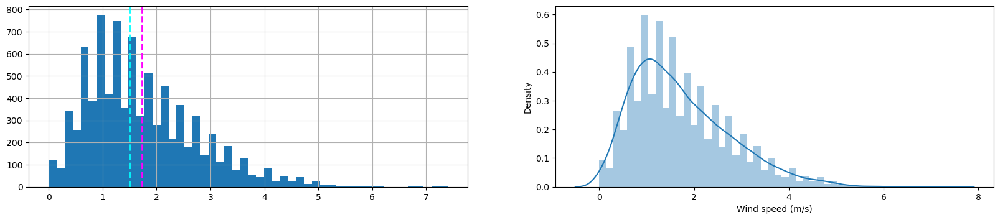



======================================== Visibility (10m) ========================================




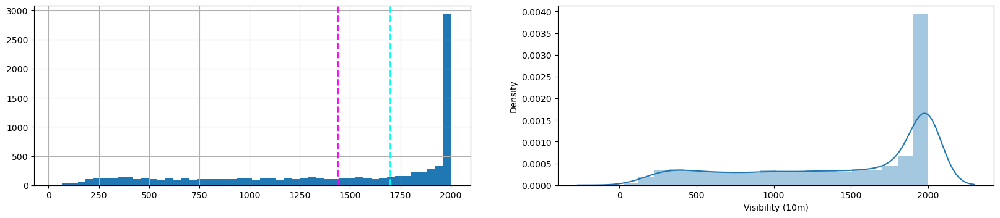



======================================== Dew point temperature(°C) ========================================




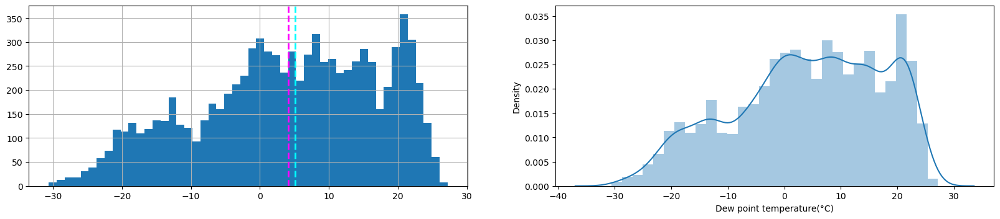



======================================== Solar Radiation (MJ/m2) ========================================




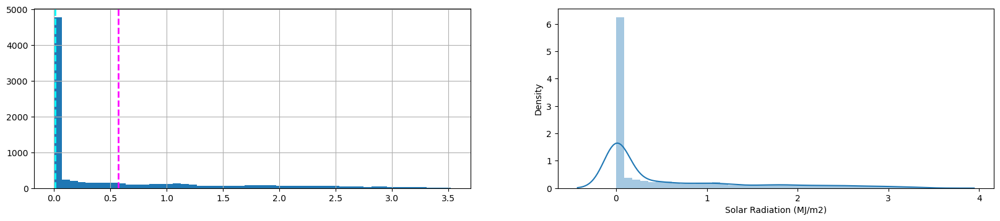



======================================== Rainfall(mm) ========================================




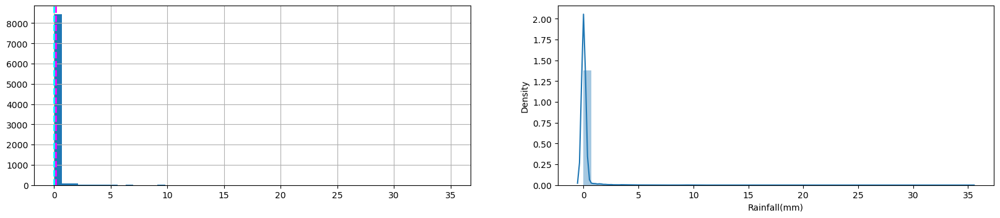



======================================== Snowfall (cm) ========================================




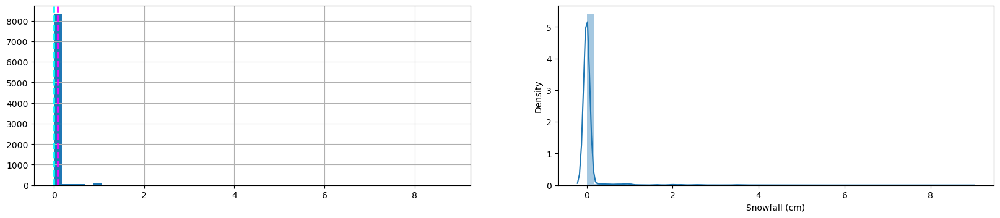

In [37]:
# Plotting Histogram with mean and median, and Distplot of all the numeric features of the dataset to observe skewness of our numerical features

n=1
for i in num_features.columns:
  plt.figure(figsize=(20,40))
  plt.subplot(9,2,n)
  n+=1
  print('\n')
  print('='*40,i,'='*40)
  print('\n')
  feature=df_bike[i]
  feature.hist(bins=50,)
  plt.axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2)
  plt.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2) 
  plt.subplot(9,2,n)
  n+= 1
  sns.distplot(df_bike[i])
  plt.show()


In Distplot plots we observe that some columns are right skewed and some are left skewed.

Right skewed columns are

Rented Bike Count (Its also our Dependent variable), Wind speed (m/s), Solar Radiation (MJ/m2), Rainfall(mm), Snowfall (cm),

Left skewed columns are

Visibility (10m), Dew point temperature(°C)

From Histogram we are coming to know that the features which are skewed, their mean and the median are also skewed, which was understood by looking at the graph that this would happen.

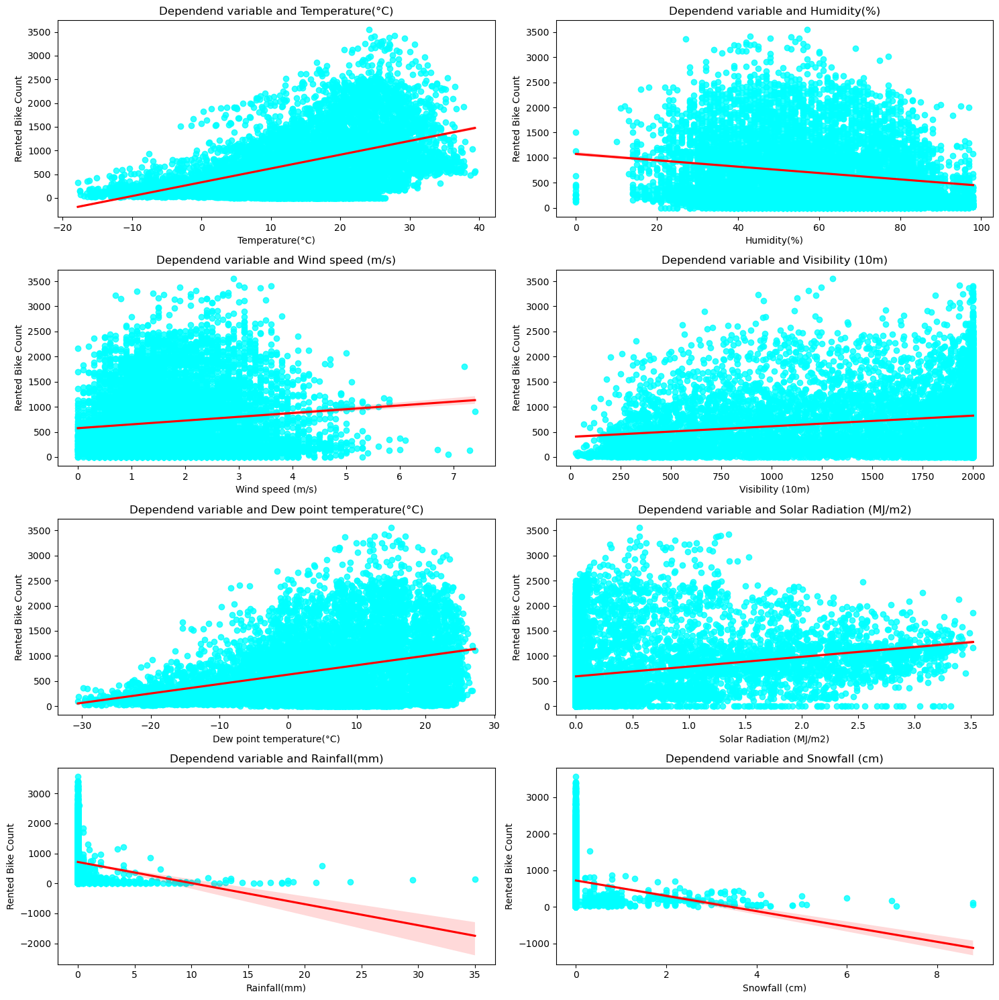

In [38]:
# Regression plot to know relation of numerical features with dependent variable
n=1
plt.figure(figsize=(15,15))
for i in num_features.columns:
  if i == 'Rented Bike Count':
    pass
  else:
    plt.subplot(4,2,n)
    n+=1
    sns.regplot(df_bike[i], df_bike['Rented Bike Count'],scatter_kws={"color": "cyan"}, line_kws={"color": "red"})
    plt.title(f'Dependend variable and {i}')
    plt.tight_layout()

This regression plots above shows that some of the features are positive linear and some are negative linear in relation to target variable.

### Correlation

In [39]:
# Correlation with Rented Bike Count

df_bike.corr()['Rented Bike Count']

Rented Bike Count            1.000000
Temperature(°C)              0.538558
Humidity(%)                 -0.199780
Wind speed (m/s)             0.121108
Visibility (10m)             0.199280
Dew point temperature(°C)    0.379788
Solar Radiation (MJ/m2)      0.261837
Rainfall(mm)                -0.123074
Snowfall (cm)               -0.141804
Name: Rented Bike Count, dtype: float64

As seen in the regression plot that some features are negatively correlated and some positive, the same thing can be seen here as well.

<AxesSubplot:>

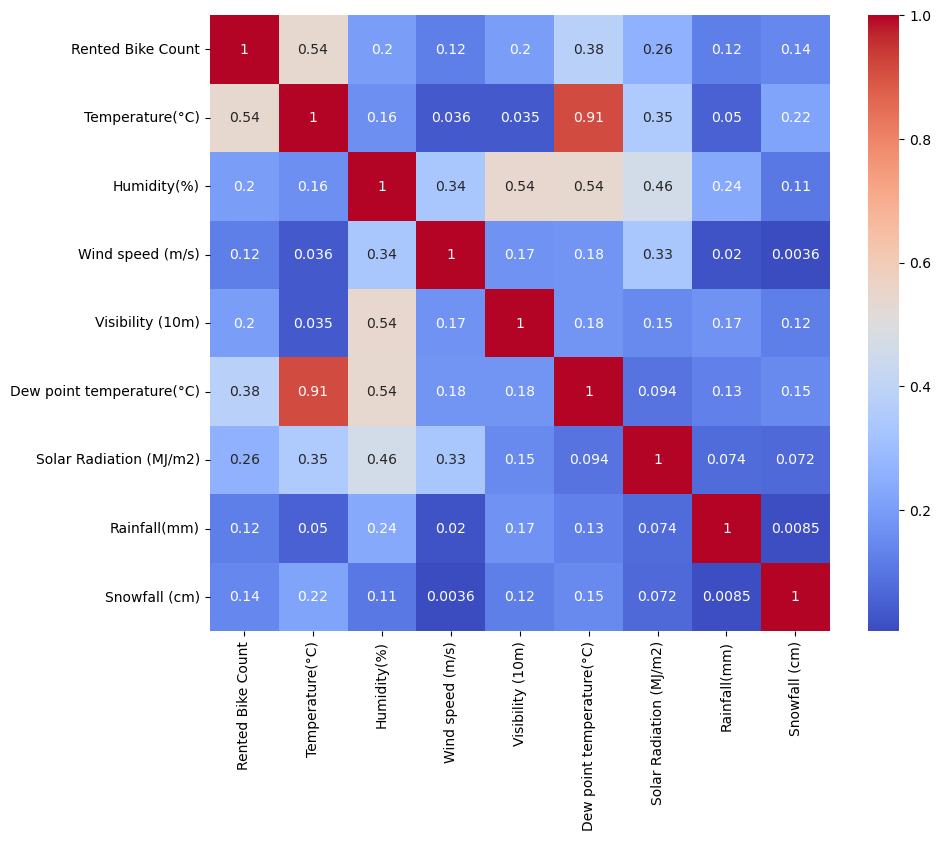

In [40]:
# Seeing Correlation of all the numerical features with the heat map to know the multicolinearity.

plt.figure(figsize=(10,8))
sns.heatmap(abs(df_bike.corr()), cmap='coolwarm', annot=True)

From the above graph it can be seen that there is multicollinearity in temperature(°C) and dew point temperature(°C) column.

In [41]:
# Multicollinearity

from statsmodels.stats.outliers_influence import variance_inflation_factor
def get_vif(X):
 
   # Calculating VIF
   vif = pd.DataFrame()
   vif["variables"] = X.columns
   vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
 
   return(vif)

In [42]:
get_vif(df_bike[[i for i in df_bike.describe().columns if i not in ['Rented Bike Count', 'Dew point temperature(°C)']]])

,variables,VIF
0,Temperature(°C),3.166007
1,Humidity(%),4.758651
2,Wind speed (m/s),4.079926
3,Visibility (10m),4.409448
4,Solar Radiation (MJ/m2),2.246238
5,Rainfall(mm),1.078501
6,Snowfall (cm),1.118901


# 6. Classification

### Preparing data for Model building - pre-processing / feature engineering

In [43]:
df_bike['Functioning Day'].value_counts()

Yes    8465
No      295
Name: Functioning Day, dtype: int64

In [44]:
df_bike['week'].value_counts()

Weekdays    6216
Weekend     2544
Name: week, dtype: int64

In [45]:
# Collecting categorical and numerical columns

num_features_cols = ['Rented Bike Count', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)','Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']
cat_features_cols = ['Hour', 'Seasons', 'Holiday', 'month', 'week', 'year']

### Scaling Numerical data - Min Max Scaler

In [46]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_bike[num_features_cols])
df_bike_sc_clf = pd.DataFrame(data=scaled_data, columns=df_bike[num_features_cols].columns)


### Encoding Categorical data - One hot encoding

In [47]:
ohe = OneHotEncoder(drop='first')
df_array = ohe.fit_transform(df_bike[cat_features_cols]).toarray()
# convert the NumPy array to a dataframe
df_bike_enc_clf = pd.DataFrame(df_array, columns=ohe.get_feature_names(['Hour', 'Seasons', 'Holiday', 'month', 'week', 'year']))


In [48]:
# Concating Scaled and Encoded data

df_bike_clf = pd.concat([df_bike_sc_clf,df_bike_enc_clf],axis=1)

In [49]:
X = df_bike_clf
y = df_bike["Functioning Day"]

In [50]:
# Train Test split data
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.25,random_state=42)

In [51]:
# Shape of X_train, X_test, y_train, y_test

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6570, 49), (2190, 49), (6570,), (2190,))

### Finding best value of n_neighbors parameter

Text(0, 0.5, 'score')

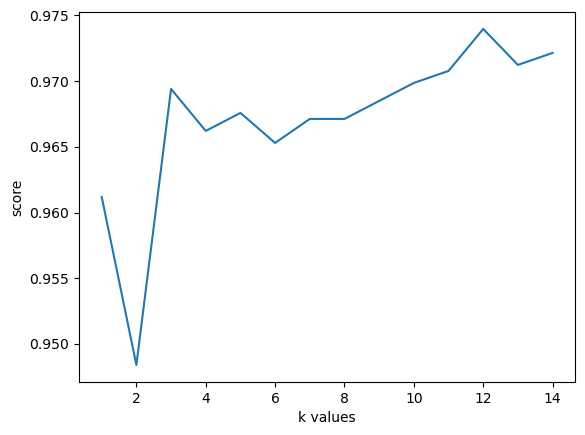

In [52]:
# Finding best value of n_neighbors parameter

score_list=[]
for each in range(1,15):
    knn2 = KNeighborsClassifier(n_neighbors=each)
    knn2.fit(X_train,y_train)
    score_list.append(knn2.score(X_test,y_test))

plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("score")

It can be seen, the best value of n_neighbor is 12. Let's find metrics when n_neighbors=12

#### Summary - Preprocessing/Feature Engineering -

1. Checked for missing value inside the dataset and no missing values where found
2. Separated the numerical and categorical features 
3. For numerical features, applied MinMax Scaler to make sure that all the features are in the same scale
4. For categorical features, applied one hot encoding to ensure that categorical features are converted into algorithm format
5. Date column is splitted into 3 categorical column - day of week, month and year
6. The Hour column is a numerical column but it is a time stamp so we treat Hour as a categorical feature


### Classification models fit and the evaluation metrics
1. Logistic Regression Classification
2. KNeighbors Classifier
3. Support Vector Machine
4. Naive Bayes Classification
5. Decision Tree Classification

Binary field 'Functioning Day' is taken as Target attribute

In [53]:
# Classification Models

log_clf = LogisticRegression()
svc_clf = SVC()
knn_clf = KNeighborsClassifier(n_neighbors=12)
dt_clf = DecisionTreeClassifier(max_depth = 2, random_state=42)
nb_clf = GaussianNB()
rf_clf = RandomForestClassifier()

In [54]:
# Solving Class Imbalance

resample = SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'))
X_smot, y_smot = resample.fit_resample(X_train, y_train.ravel())



======================================== Logistic Regression Classification ========================================


Logistic Regression Classification Test Accuracy: 0.9684931506849315
Confusion Matrix:


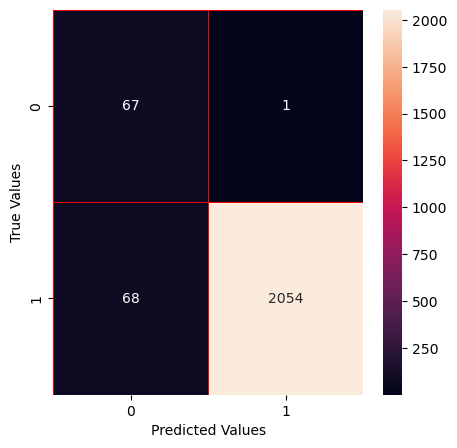

Classification Report:
              precision    recall  f1-score   support

          No       0.50      0.99      0.66        68
         Yes       1.00      0.97      0.98      2122

    accuracy                           0.97      2190
   macro avg       0.75      0.98      0.82      2190
weighted avg       0.98      0.97      0.97      2190



======================================== KNeighbors Classifier ========================================


KNeighbors Classifier Test Accuracy: 0.8954337899543379
Confusion Matrix:


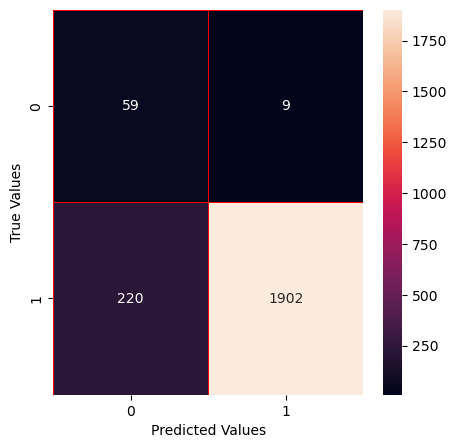

Classification Report:
              precision    recall  f1-score   support

          No       0.21      0.87      0.34        68
         Yes       1.00      0.90      0.94      2122

    accuracy                           0.90      2190
   macro avg       0.60      0.88      0.64      2190
weighted avg       0.97      0.90      0.92      2190



======================================== Support Vector Machine ========================================


Support Vector Machine Test Accuracy: 0.9840182648401826
Confusion Matrix:


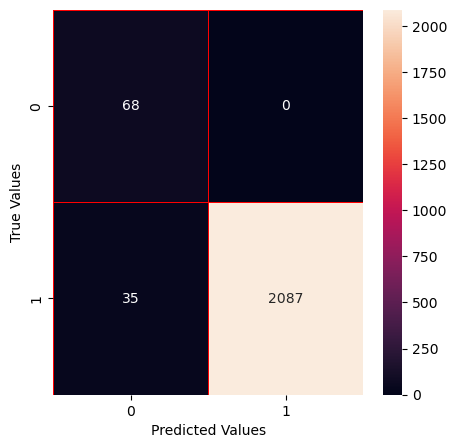

Classification Report:
              precision    recall  f1-score   support

          No       0.66      1.00      0.80        68
         Yes       1.00      0.98      0.99      2122

    accuracy                           0.98      2190
   macro avg       0.83      0.99      0.89      2190
weighted avg       0.99      0.98      0.99      2190



======================================== Naive Bayes Classification ========================================


Naive Bayes Classification Test Accuracy: 0.9995433789954338
Confusion Matrix:


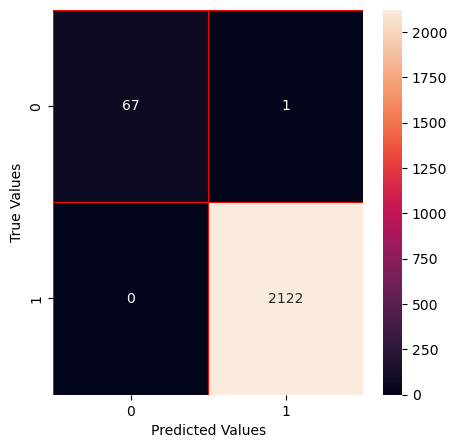

Classification Report:
              precision    recall  f1-score   support

          No       1.00      0.99      0.99        68
         Yes       1.00      1.00      1.00      2122

    accuracy                           1.00      2190
   macro avg       1.00      0.99      1.00      2190
weighted avg       1.00      1.00      1.00      2190



======================================== Decision Tree Classification ========================================


Decision Tree Classification Test Accuracy: 1.0
Confusion Matrix:


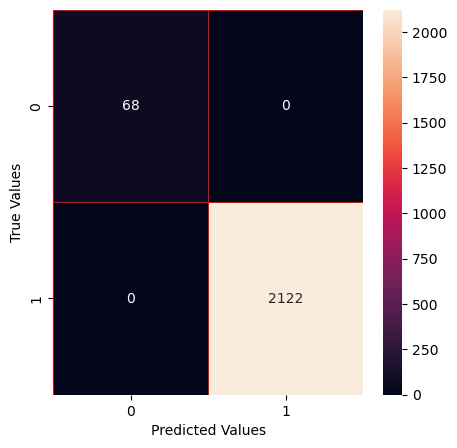

Classification Report:
              precision    recall  f1-score   support

          No       1.00      1.00      1.00        68
         Yes       1.00      1.00      1.00      2122

    accuracy                           1.00      2190
   macro avg       1.00      1.00      1.00      2190
weighted avg       1.00      1.00      1.00      2190



In [55]:
# Classification models fit and the evaluation metrics

method_names = []
method_scores = []

for clf in [[log_clf,'Logistic Regression Classification'], [knn_clf,'KNeighbors Classifier'], [svc_clf, 'Support Vector Machine'], [nb_clf,'Naive Bayes Classification'], [dt_clf,'Decision Tree Classification']]:
  print('\n')
  print('='*40,clf[1],'='*40)
  print('\n')
  clf[0].fit(X_smot, y_smot) #Fitting
  print("{} Test Accuracy: {}".format(clf[1],clf[0].score(X_test,y_test)))
  method_names.append(clf[1])
  method_scores.append(clf[0].score(X_test,y_test))
  #Confusion Matrix
  y_pred = clf[0].predict(X_test)
  conf_mat = confusion_matrix(y_test,y_pred)
  print('Confusion Matrix:')
  #Visualization Confusion Matrix
  f, ax = plt.subplots(figsize=(5,5))
  sns.heatmap(conf_mat,annot=True,linewidths=0.5,linecolor="red",fmt=".0f",ax=ax)
  plt.xlabel("Predicted Values")
  plt.ylabel("True Values")
  plt.show()
  
  print('Classification Report:')
  print(classification_report(y_test,y_pred))

# 7. Ensemble ML - Classification

### Preparing data for Model building - pre-processing / feature engineering

In [56]:
df_bike['Functioning Day'].value_counts()

Yes    8465
No      295
Name: Functioning Day, dtype: int64

In [57]:
df_bike['week'].value_counts()

Weekdays    6216
Weekend     2544
Name: week, dtype: int64

In [58]:
# Collecting categorical and numerical columns

num_features_cols = ['Rented Bike Count', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)','Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']
cat_features_cols = ['Hour', 'Seasons', 'Holiday', 'month', 'Functioning Day', 'year']

### Scaling Numerical data - Min Max Scaler

In [59]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_bike[num_features_cols])
df_bike_sc_enclf = pd.DataFrame(data=scaled_data, columns=df_bike[num_features_cols].columns)

### Encoding Categorical data - One hot encoding

In [60]:
ohe = OneHotEncoder(drop='first')
df_array = ohe.fit_transform(df_bike[cat_features_cols]).toarray()
# convert the NumPy array to a dataframe
df_bike_enc_enclf = pd.DataFrame(df_array, columns=ohe.get_feature_names(['Hour', 'Seasons', 'Holiday', 'month', 'Functioning Day', 'year']))

In [61]:
# Concating Scaled and Encoded data

df_bike_enclf = pd.concat([df_bike_sc_enclf,df_bike_enc_enclf],axis=1)

In [62]:
df_bike['week'].value_counts()

Weekdays    6216
Weekend     2544
Name: week, dtype: int64

In [63]:
X = df_bike_enclf
y = df_bike["week"]

In [64]:
# Train Test split data
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.25,random_state=42)

### Ensemble models fit and the evaluation metrics
1. Random Forest Classifier
2. Gradient Boosting Classifier
3. Ada Boost Classifier


In [65]:
# Ensemble Models

rfc_enclf = RandomForestClassifier(random_state=1)
gb_enclf = GradientBoostingClassifier()
abc_enclf = AdaBoostClassifier(random_state=42)


In [66]:
from imblearn.over_sampling import SMOTE
smot = SMOTE(sampling_strategy='minority')
X_smot, y_smot = smot.fit_resample(X_train, y_train)



======================================== Random Forest Classifier ========================================


Random Forest Classifier Test Accuracy: 0.845662100456621
Confusion Matrix:


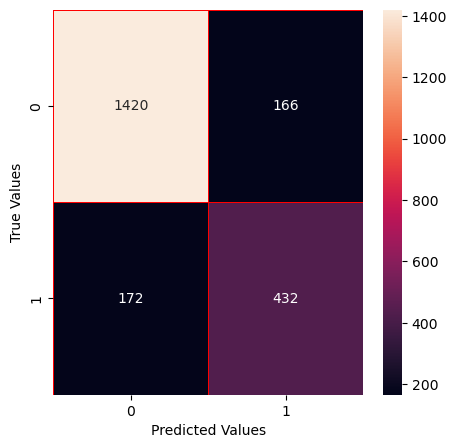

Classification Report:
              precision    recall  f1-score   support

    Weekdays       0.89      0.90      0.89      1586
     Weekend       0.72      0.72      0.72       604

    accuracy                           0.85      2190
   macro avg       0.81      0.81      0.81      2190
weighted avg       0.85      0.85      0.85      2190



======================================== Gradient Boosting Classifier ========================================


Gradient Boosting Classifier Test Accuracy: 0.6735159817351598
Confusion Matrix:


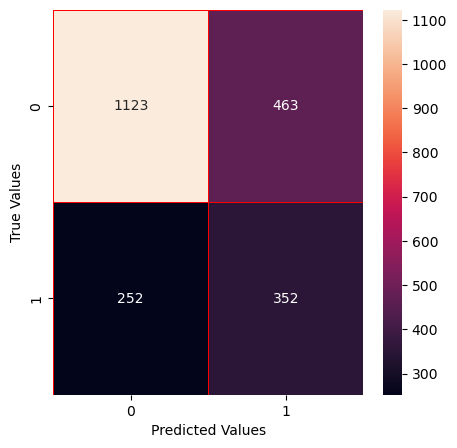

Classification Report:
              precision    recall  f1-score   support

    Weekdays       0.82      0.71      0.76      1586
     Weekend       0.43      0.58      0.50       604

    accuracy                           0.67      2190
   macro avg       0.62      0.65      0.63      2190
weighted avg       0.71      0.67      0.69      2190



======================================== Ada Boost Classifier ========================================


Ada Boost Classifier Test Accuracy: 0.5639269406392694
Confusion Matrix:


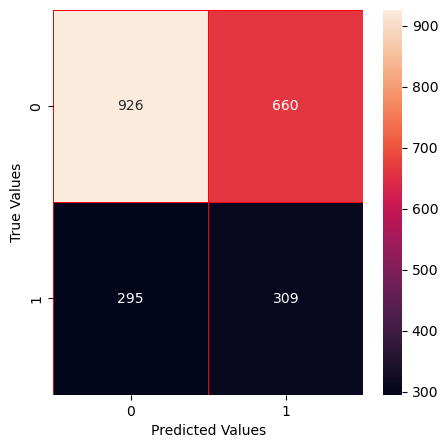

Classification Report:
              precision    recall  f1-score   support

    Weekdays       0.76      0.58      0.66      1586
     Weekend       0.32      0.51      0.39       604

    accuracy                           0.56      2190
   macro avg       0.54      0.55      0.53      2190
weighted avg       0.64      0.56      0.59      2190



In [67]:
# Classification models fit and the evaluation metrics

method_names = []
method_scores = []

for clf in [[rfc_enclf,'Random Forest Classifier'], [gb_enclf,'Gradient Boosting Classifier'], [abc_enclf, 'Ada Boost Classifier']]:
  print('\n')
  print('='*40,clf[1],'='*40)
  print('\n')
  clf[0].fit(X_smot, y_smot) #Fitting
  print("{} Test Accuracy: {}".format(clf[1],clf[0].score(X_test,y_test)))
  method_names.append(clf[1])
  method_scores.append(clf[0].score(X_test,y_test))
  #Confusion Matrix
  y_pred = clf[0].predict(X_test)
  conf_mat = confusion_matrix(y_test,y_pred)
  print('Confusion Matrix:')
  #Visualization Confusion Matrix
  f, ax = plt.subplots(figsize=(5,5))
  sns.heatmap(conf_mat,annot=True,linewidths=0.5,linecolor="red",fmt=".0f",ax=ax)
  plt.xlabel("Predicted Values")
  plt.ylabel("True Values")
  plt.show()
  
  print('Classification Report:')
  print(classification_report(y_test,y_pred))

### Classification & Ensemble - Observations/Conclusion:



1. Bike rental count is high during week days then weekend days.

2. The rental bike counts is at its peek at 8 AM in the morning and 6pm in the evening, We can see an increasing trend from 5am to 8 am, the graph touches the peak at 8am and then there is dip in the graph. Later we can see a gradual increase in the demand until 6pm, the demand is highest at 6 pm, and reduces there after until midnight,

3. People prefer to rent bikes at moderate to high tempreture, and even when it is little windy, it is observed that highest bike rental count is in Autumn and summer seasons and the lowest is in winter season.

4. Bike rentals is highest during the clear days and lowest on snowy and rainy days.

#### Evaluation Metrics - Since the problem is a multiclass classification problem with imbalanaced data set, therefore we have gone ahead with precision, recall and f1-score as our evaluation metric.

1. Confusion Matrix: A table showing correct predictions and types of incorrect predictions.

2. Precision: The number of true positives divided by all positive predictions. Precision is also called Positive Predictive Value. It is a measure of a classifier’s exactness. Low precision indicates a high number of false positives.

3. Recall: The number of true positives divided by the number of positive values in the test data. The recall is also called Sensitivity or the True Positive Rate. It is a measure of a classifier’s completeness. Low recall indicates a high number of false negatives.

4. F1-score: The weighted average of precision and recall.

5. Support: It is the total entries of each class in the actual dataset.

#### When compared the test accuracy, f1-score, precision and recall of all the models, KNeighbors Classifier and Random Forest Classifier gives the best Score with proper fit in Classification and Ensembled model respectively. Test accuracy and f1-score is 0.90 for KNeighbors Classifier model and Test accuracy and f1-score is 0.85 for Random Forest Classifier. So these two models are the best for predicting the bike rental count on daily basis.

# 8. Regression

### Creating Function to train and evaluate the model with diffrent parameters like MSE , RMSE, R2 Score, Best_params, Best score, Coefficient , Intercept and Feature Importance

In [68]:
# Appending all models evalution scores to the corrosponding list after hyperarameter

mean_absolut_error_ht = []
mean_sq_error_ht=[]
root_mean_sq_error_ht=[]
training_score_ht =[]
r2_list_ht=[]
adj_r2_list_ht=[]

In [69]:
# creating a function for fit, predict and evaluting the models and append all evalution score in list 

def eval_metrics (model, X_train, X_test, y_train, y_test, linear = False):
  #training the model
  model.fit(X_train,y_train)

  # Training Score
  training  = model.score(X_train,y_train)
  print('*'*30, 'Training score', '*'*30)
  print("Training score  =", training)

  print('\n')

  try:
      # finding the best parameters of the model if any 
    print('*'*30, 'Best Parameters & Best Score', '*'*30)
    print(f"The best parameters found out to be :{model.best_params_} \nwhere model best score is:  {model.best_score_} \n")
  except:
    print('None')
    
    

  #predicting the Test set and evaluting the models 
  print('\n')
  print('*'*30, 'Evalution Metrics', '*'*30)

  if linear == True:
    y_pred = model.predict(X_test)

    #finding mean_absolute_error
    MAE  = mean_absolute_error(y_test**2,y_pred**2)
    print("MAE :" , MAE)

    #finding mean_squared_error
    MSE  = mean_squared_error(y_test**2,y_pred**2)
    print("MSE :" , MSE)

    #finding root mean squared error
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)

    #finding the r2 score
    
    r2 = r2_score(y_test**2,y_pred**2)
    print("R2 :" ,r2)
    #finding the adjusted r2 score
    adj_r2=1-(1-r2_score(y_test**2,y_pred**2))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    print("Adjusted R2 : ",adj_r2,'\n')
  
  else:
    # for tree base models
    y_pred = model.predict(X_test)

    #finding mean_absolute_error
    MAE  = mean_absolute_error(y_test,y_pred)
    print("MAE :" , MAE)

    #finding mean_squared_error
    MSE  = mean_squared_error(y_test,y_pred)
    print("MSE :" , MSE)

    #finding root mean squared error
    RMSE = np.sqrt(MSE)
    print("RMSE :" ,RMSE)

    #finding the r2 score
    
    r2 = r2_score(y_test,y_pred)
    print("R2 :" ,r2)
    #finding the adjusted r2 score
    adj_r2=1-(1-r2_score(y_test,y_pred))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    print("Adjusted R2 : ",adj_r2,'\n')

    #Top 10 feature importance graph
    try:
      best = model.best_estimator_
      features = new_X.columns
      importances = best.feature_importances_[0:10]
      indices = np.argsort(importances)
      plt.figure(figsize=(10,15))
      plt.title('Feature Importance')
      plt.barh(range(len(indices)), importances[indices], color='pink',edgecolor='red' ,align='center')
      plt.yticks(range(len(indices)), [features[i] for i in indices])
      plt.xlabel('Relative Importance')
      plt.show()
    
    except:
      pass
  
  # Here we appending the parameters for all models 
  mean_absolut_error_ht.append(MAE)
  mean_sq_error_ht.append(MSE)
  root_mean_sq_error_ht.append(RMSE)
  training_score_ht.append(training)
  r2_list_ht.append(r2)
  adj_r2_list_ht.append(adj_r2)

  
  # print the cofficient and intercept of which model have these parameters and else we just pass them
  if model == Linear:
    print("*"*25, "coefficient", "*"*25)
    print(model.coef_)
    print('\n')
    print("*"*25, "Intercept", "*"*25)
    print('\n')
    print(model.intercept_)
  else:
    pass
  print('\n')
  
  print('*'*20, 'ploting the graph of Actual and predicted only with 80 observation', '*'*20)

  # ploting the graph of Actual and predicted only with 80 observation for better visualisation which model have these parameters and else we just pass them
  try:
    # ploting the line graph of actual and predicted values  
    plt.figure(figsize=(15,7))
    plt.plot((y_pred)[:80])
    plt.plot((np.array(y_test)[:80]))
    plt.legend(["Predicted","Actual"])
    plt.show()
  except:
    pass



### Creating Functions for Model Explainability

Model explainability refers to the concept of being able to understand the machine learning model. For example – If a healthcare model is predicting whether a patient is suffering from a particular disease or not. The medical practitioners need to know what parameters the model is taking into account or if the model contains any bias. So, it is necessary that once the model is deployed in the real world. Then, the model developers can explain the model.
Below are the customed made Model Explainability modules created -

### Lime

In [70]:
def model_explainability_lime(model,num_features,row_number):
  test = pd.DataFrame(X_test)
  lime_explainer = lime_tabular.LimeTabularExplainer(
      training_data = X_train_scaled,
      feature_names = new_X.columns.values,
      mode = 'regression',
      verbose=True,
      random_state =42 )

  lime_exp = lime_explainer.explain_instance(
      data_row = X_test.iloc[row_number],
      predict_fn = model.predict,num_features=num_features,
  )
  return lime_exp.show_in_notebook(show_table=True,)

#### Shap

In [71]:
def model_explainability_shap(model,for_instance):
  # Initialize JavaScript visualizations in notebook environment
  shap.initjs()
  # Define a tree explainer for the built model
  explainer = shap.TreeExplainer(model)
  # obtain shap values for the first row of the test data
  shap_values = explainer(X_test,check_additivity=False)
  # visualize the first prediction's explanation with a force plot
  return shap.plots.force(shap_values[for_instance])

#### ELI5

In [72]:
# Show Prediction and explaining with all features
def model_explainability_eli5(model,row_number) :
  return eli.show_prediction(model, np.array(X_test.iloc[row_number]),
                    feature_names=X_test.columns.values,
                    show_feature_values=True)

### Preparing data for Linear Model building - pre-processing / feature engineering

#### Encoding categorical data -  Dummification

In [73]:
df_bike_sc_reg=pd.get_dummies(df_bike,drop_first=True,sparse=True)

It was seen that the dependent variable is right skewed, it needs to be normalized.

Text(0.5, 1.0, 'Square root')

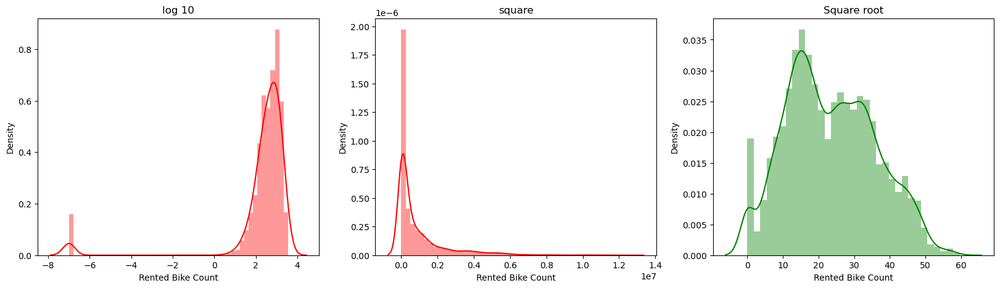

In [74]:
# Normalizing Dependent variable which is right skewed

fig,axes = plt.subplots(1,3,figsize=(20,5))
# here we use log10 
sns.distplot(np.log10(df_bike_sc_reg['Rented Bike Count']+0.0000001),ax=axes[0],color='red').set_title("log 10")
# here we use square 
sns.distplot((df_bike_sc_reg['Rented Bike Count']**2),ax=axes[1],color='red').set_title("square")
# here we use square root 
sns.distplot(np.sqrt(df_bike_sc_reg['Rented Bike Count']),ax=axes[2], color='green').set_title("Square root")

Dependent variable in green plot is normalized to some extent, hence, will go with square root on our dependent variable

In [75]:
X = df_bike_sc_reg.drop(columns=['Rented Bike Count','Dew point temperature(°C)'])
y = np.sqrt(df_bike_sc_reg['Rented Bike Count'])

In [76]:
# Train test split our data
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.25,random_state=42)

In [77]:
# Shape of X_train, X_test, y_train, y_test

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6570, 48), (2190, 48), (6570,), (2190,))

### yeo-johnson transformation

In [78]:
# Transforming X_train and X_test with yeo-johnson transformation


yeo = PowerTransformer()
X_train_trans = yeo.fit_transform(X_train) # fit transform the training set
X_test_trans = yeo.transform(X_test) #tranform the test set

#### Summary - Preprocessing/Feature Engineering -
1. Checked for missing value inside the dataset and no missing values where found
2. Separated the numerical and categorical features
3. For numerical features, applied MinMax Scaler to make sure that all the features are in the same scale
4. For categorical features, applied one hot encoding to ensure that categorical features are converted into algorithm format
5. Date column is splitted into 3 categorical column - day of week, month and year
6. The Hour column is a numerical column but it is a time stamp so we treat Hour as a categorical feature
7. Applied Power Transformation - yeo-johnson transformation. Power transforms are a family of parametric, monotonic transformations that are applied to make data more Gaussian-like
8. Normalized the right skewed Dependent variable by using square root

### Regression models fit and the evaluation metrics
1. Linear Models
    a. Linear Regression
    b. Regularization Techniques
        i.   Lasso
        ii.  Ridge
        iii. Polynomial
    c. Stochastic Gradient Descent Regressor
2. Tree based model - Decision Tree
    

Field 'Rented Bike Count' is taken as Target attribute

### Linear Model fit and the Evaluation metrics

#### Linear Regression

****************************** Training score ******************************
Training score  = 0.79481312228197


****************************** Best Parameters & Best Score ******************************
None


****************************** Evalution Metrics ******************************
MAE : 207.41666781201465
MSE : 93868.92032708644
RMSE : 306.3803523842324
R2 : 0.7706043626913299
Adjusted R2 :  0.7654614432187394 

************************* coefficient *************************
[ 4.84244127 -1.46299863 -0.10044715  0.29088451  3.15181294 -2.97282854
  0.01791101 -0.43657148 -1.06081323 -1.41706587 -2.02154163 -1.92712698
 -0.95802639  0.01025612  0.86074665 -0.51390573 -1.51276992 -1.57296373
 -1.37571477 -1.34499939 -1.29350974 -1.09078416 -0.68059033  0.28889088
  1.67507948  1.32330204  1.31495447  1.37700904  1.00303563  0.34014356
 -1.32715513 -1.38178009 -3.39349515  0.60842228  5.30792837 -0.23217729
  0.00764478 -0.20277928 -0.01720571 -0.28303424  0.95185455 -0.17567796

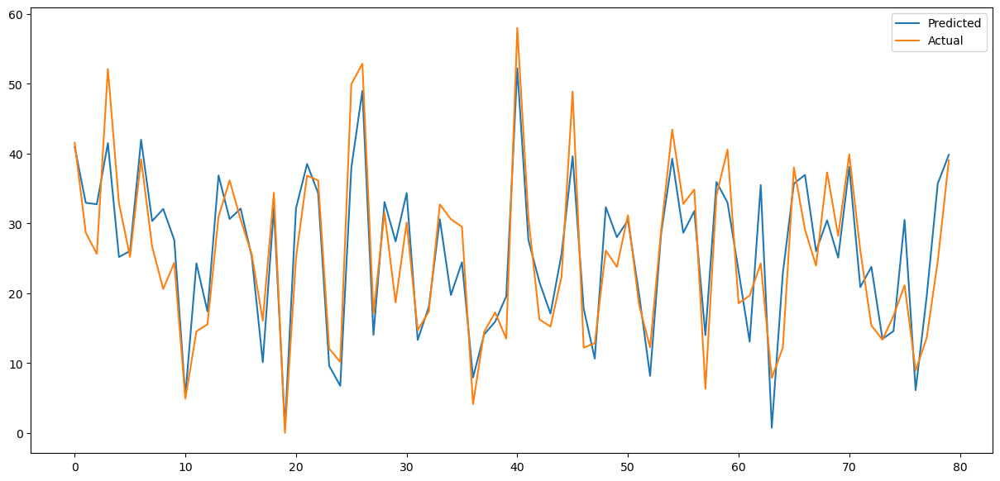

In [79]:
# imporing linear Regression model and fitting the model with the previously created eval_metrics function 

Linear = LinearRegression()

eval_metrics(Linear,X_train_trans,X_test_trans,y_train,y_test,linear=True)

#### Regularization Techniques

#### Lasso

****************************** Training score ******************************
Training score  = 0.7948109383040991


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'alpha': 0.0014} 
where model best score is:  0.790929603738752 



****************************** Evalution Metrics ******************************
MAE : 207.48363093728983
MSE : 93964.52838401185
RMSE : 306.53634104949424
R2 : 0.7703707169747943
Adjusted R2 :  0.7652225592983768 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


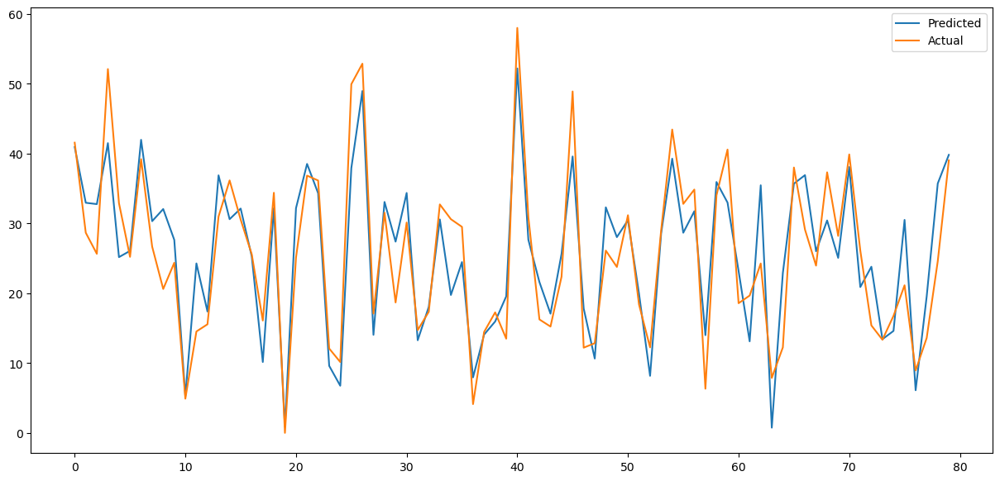

In [80]:
# Using Grid Search CV for Hyperparameter tuning for Lasso Regression and fitting the model with the previously created eval_metrics function 
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]} #lasso parameters 
L1 = GridSearchCV(Lasso(), parameters, cv=5) #using gridsearchcv and cross validate the model

eval_metrics(L1,X_train_trans,X_test_trans,y_train,y_test,linear=True)

#### Ridge

****************************** Training score ******************************
Training score  = 0.794812829295702


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'alpha': 1.9} 
where model best score is:  0.7909152882780003 



****************************** Evalution Metrics ******************************
MAE : 207.43841459681704
MSE : 93898.28667526146
RMSE : 306.4282732961524
R2 : 0.7705325975945166
Adjusted R2 :  0.7653880691893493 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


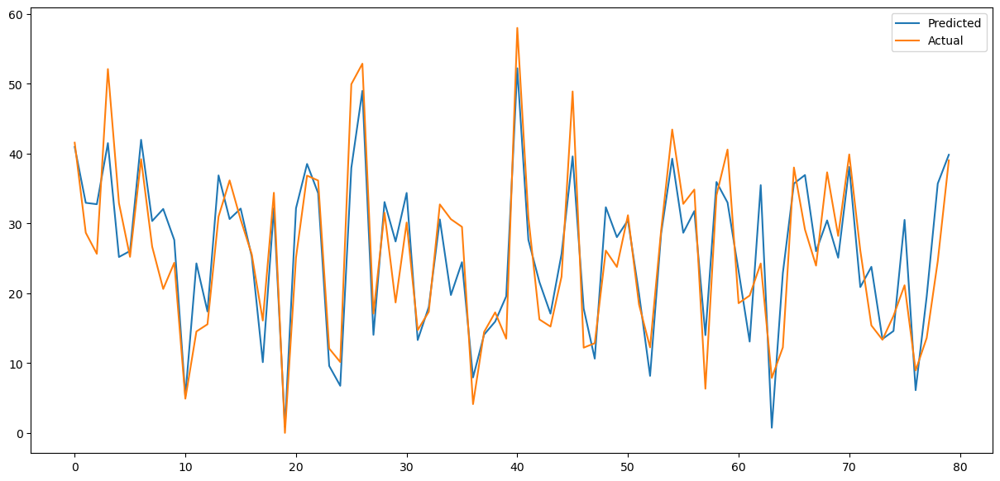

In [81]:
# Using Grid Search CV for Hyperparameter tuning for Lasso Regression and fitting the model with the previously created eval_metrics function 
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100,0.5,1.5,1.6,1.7,1.8,1.9]} # giving parameters 
L2 = GridSearchCV(Ridge(), parameters, scoring='r2', cv=5) #using gridsearchcv and cross validate the model

eval_metrics(L2,X_train_trans,X_test_trans,y_train,y_test,linear=True)

#### Polynomial

****************************** Training score ******************************
Training score  = 0.9259916894887772


****************************** Best Parameters & Best Score ******************************
None


****************************** Evalution Metrics ******************************
MAE : 132.81073895646557
MSE : 47668.34462391588
RMSE : 218.3308146458394
R2 : 0.8835087241192315
Adjusted R2 :  0.7354777978184626 

************************* coefficient *************************
[ 2.22813455e+08  2.21945530e+00 -1.32661326e+00 ...  6.11665624e+11
 -3.74008179e-01 -5.58098818e+11]


************************* Intercept *************************


659344326932.5782


******************** ploting the graph of Actual and predicted only with 80 observation ********************


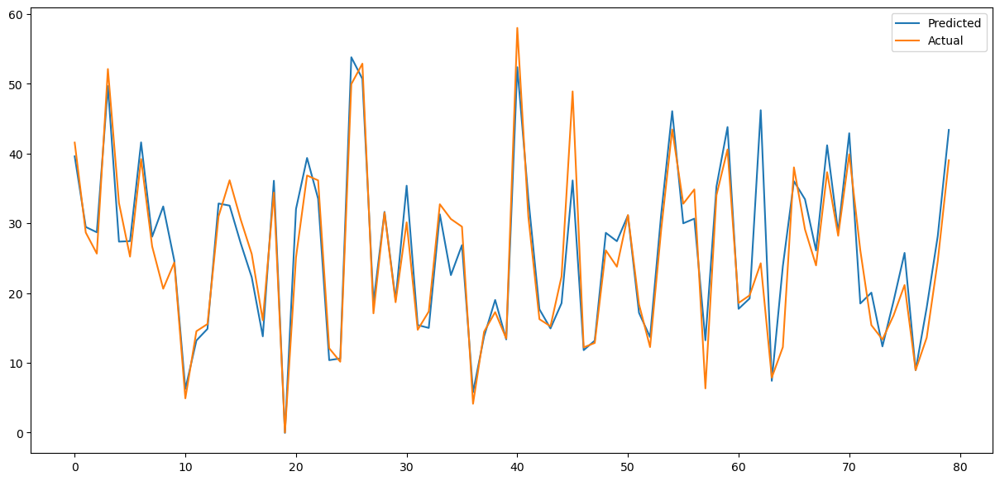

In [82]:
# Creating variable with degree 2 and fitting the model with the previously created eval_metrics function 

poly = PolynomialFeatures(2) 
poly_X_train = poly.fit_transform(X_train_trans) # fit the train set
poly_X_test = poly.transform(X_test_trans) #transform the test set
eval_metrics(Linear, poly_X_train,poly_X_test,y_train,y_test,linear=True)

#### Stochastic Gradient Descent Regressor

In [83]:
# Parameters for Grid search
params = {'penalty':['l2', 'l1', 'elasticnet'],
          'alpha' : [0.01,0.0001,0.1],
          'max_iter':[1000,800,1200],
          'learning_rate':['constant','optimal','invscaling']
          }

Fitting 2 folds for each of 81 candidates, totalling 162 fits
****************************** Training score ******************************
Training score  = 0.7934819903459349


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'alpha': 0.0001, 'learning_rate': 'invscaling', 'max_iter': 1000, 'penalty': 'l2'} 
where model best score is:  0.7883597240510736 



****************************** Evalution Metrics ******************************
MAE : 4.245303477267489
MSE : 30.678380981403787
RMSE : 5.538806819289132
R2 : 0.7972957708618176
Adjusted R2 :  0.7927512575509195 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


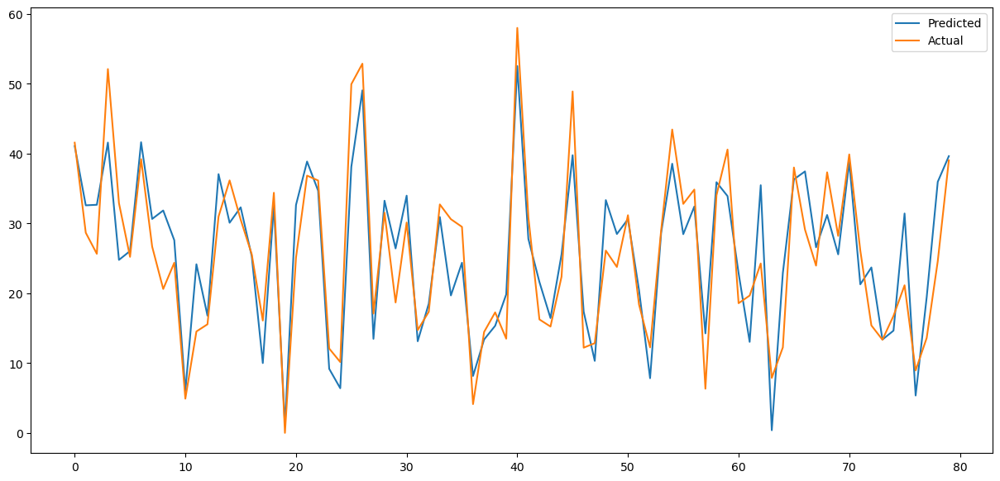

In [84]:
# Creating variable of gridesearch and fitting the model with the previously created eval_metrics function 
sgd_grid= GridSearchCV(SGDRegressor(),param_grid=params,cv=2,verbose=True)
eval_metrics(sgd_grid,X_train_trans,X_test_trans,y_train,y_test)


### Tree Base Models and the Evaluation Metrics

### Preparing data for Tree Base Model building - pre-processing / feature engineering

Here all independent features to be used because multicollinearty not effecting tree base models. Also our dependent variable are not getting transformed because distribution of the dependent variable not effect the model accuracy

In [85]:
# Creating DataFrame for tree base models
df_bike_tree = pd.get_dummies(df_bike,columns=['Seasons','Holiday','Functioning Day','month','year','week'],drop_first=True)

In [86]:
# Split data in X and Y
new_X = df_bike_tree.drop(columns='Rented Bike Count')
new_y = df_bike_tree['Rented Bike Count']

In [87]:
# Train test split our data
X_train,X_test,y_train,y_test = train_test_split(new_X,new_y, test_size=0.25,random_state=42)

In [88]:
# Scalling data with Min Max Scaler
scaler = MinMaxScaler()

In [89]:
X_train_scaled  = scaler.fit_transform(X_train) #fitting the X_train
X_test_scaled  = scaler.transform(X_test) # transform test set

#### Decision Tree

In [90]:
# Parameters for Decission Tree model
param_grid = {'criterion':['mse'],#'squared_error', 'absolute_error',],
              'min_samples_leaf':[5],#7,10],
              'max_depth' : [18],#10,25],
              'min_samples_split': [25],#15,35],
              'max_features':['auto'],#'sqrt','log2']
              }



****************************** Training score ******************************
Training score  = 0.9194583726495018


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'criterion': 'mse', 'max_depth': 18, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 25} 
where model best score is:  0.8227379877519475 



****************************** Evalution Metrics ******************************
MAE : 151.5473553338746
MSE : 64654.08720393279
RMSE : 254.27167990936937
R2 : 0.8419991890065789
Adjusted R2 :  0.8400260058905649 



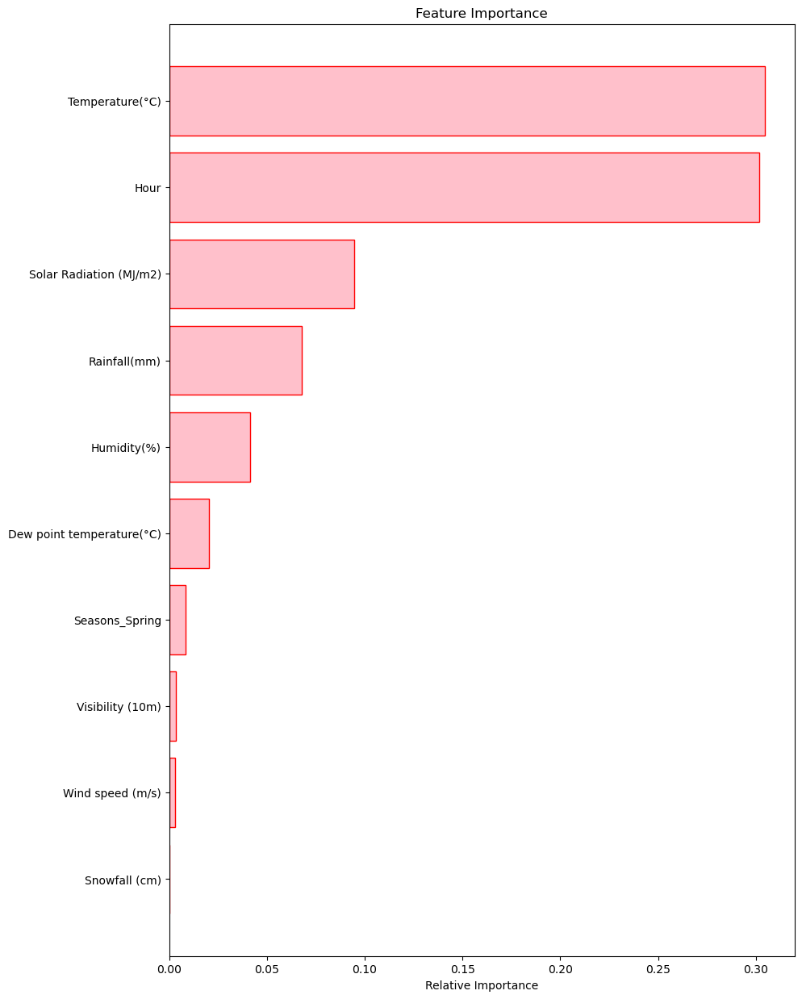



******************** ploting the graph of Actual and predicted only with 80 observation ********************


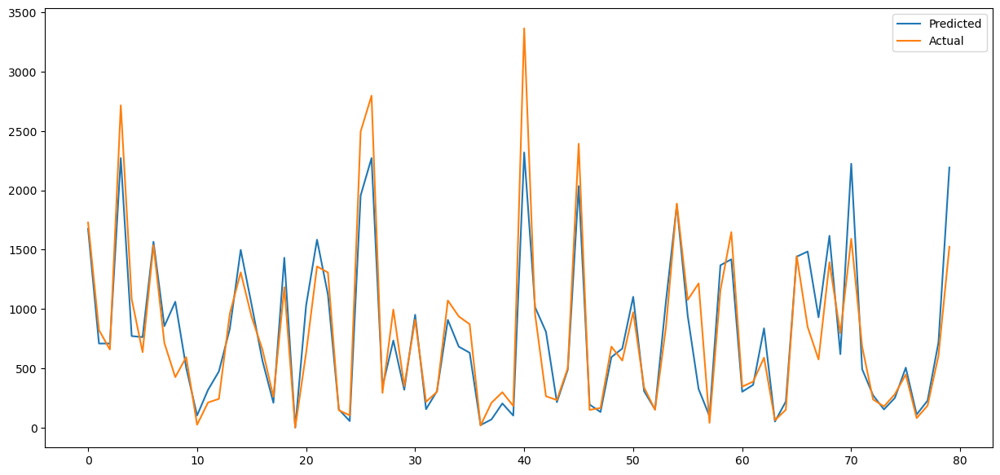

In [91]:
# Using Grid Search fitting the model with the previously created eval_metrics function 
dt_grid_search = GridSearchCV(DecisionTreeRegressor(),param_grid=param_grid,cv=5,n_jobs=-1,)

eval_metrics(dt_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

#### Decision Tree Model explainability with LIME

In [92]:
# Calling the previously created lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(dt_grid_search.best_estimator_,6,1)

Intercept 128.68403044218383
Prediction_local [1491.86174062]
Right: 643.8888888888889


#### Decision Tree Model explainability with ELI5

In [93]:
# Calling Function for model explainability with ELI5
model_explainability_eli5(dt_grid_search.best_estimator_,5)

The green color shows how much the feature contributes to the prediction of the respective class and the weights are positive for the green color.

The red color has negative weights that indicate the feature isn't contributing to the prediction of that class

#### Decision Tree Model explainability with SHAP

In [94]:
# Calling Function for model explainability with shap
model_explainability_shap(dt_grid_search.best_estimator_,2)

The base value: The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

Red/Blue: Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

# 9. Ensemble ML - Regression

### RandomForest Regression

In [95]:
param_grid = {'n_estimators':[150],#100,200],
              'min_samples_leaf':[4],#6,2],
              'max_depth' : [20],#25,30],
              'min_samples_split': [25],#30,20],
              'max_features':['auto'],#'sqrt','log2']
              }
# After finding the best parameters, we commented on all the other parameters for faster execution

****************************** Training score ******************************
Training score  = 0.9243311309058823


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 25, 'n_estimators': 150} 
where model best score is:  0.8723895645382272 



****************************** Evalution Metrics ******************************
MAE : 139.01692947131022
MSE : 52419.1077728772
RMSE : 228.95219538776473
R2 : 0.8718988713962952
Adjusted R2 :  0.8702990885691444 



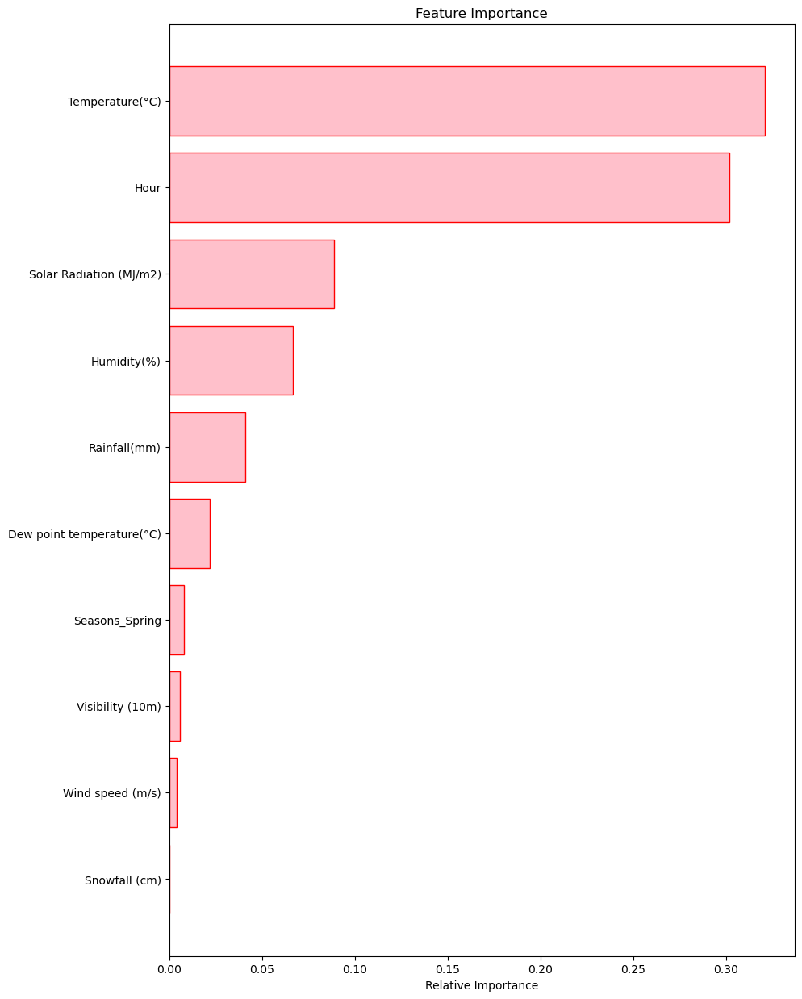



******************** ploting the graph of Actual and predicted only with 80 observation ********************


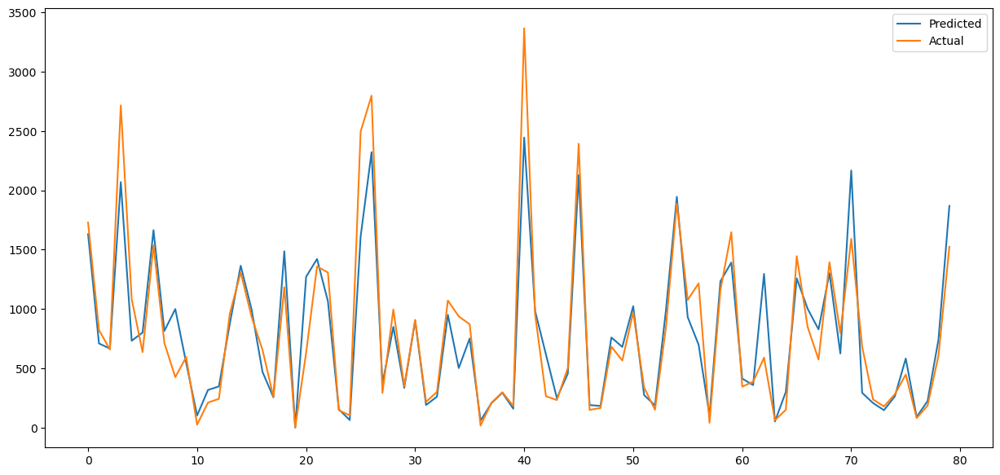

In [96]:
# Using Grid SearchCV fitting the model with the previously created eval_metrics function 
random_forest_grid_search = GridSearchCV(RandomForestRegressor(),param_grid=param_grid,n_jobs=-1,cv=5)

eval_metrics(random_forest_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

#### RandomForest Regression Model explainability with LIME

In [97]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(random_forest_grid_search.best_estimator_,6,2)

Intercept 197.22020359107762
Prediction_local [1541.55919733]
Right: 840.7231555739899


#### RandomForest Regression Model explainability with SHAP

In [98]:
# Calling our SHAP function 
model_explainability_shap(random_forest_grid_search.best_estimator_,2)

The base value: The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

Red/Blue: Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

#### RandomForest Regression Model explainability with ELI5

In [99]:
# Calling function model_explainability_eli5
model_explainability_eli5(random_forest_grid_search.best_estimator_,5)

The green color shows how much the feature contributes to the prediction of the respective class and the weights are positive for the green color.

The red color has negative weights that indicate the feature isn't contributing to the prediction of that class

### Gradient Boosting Regressor

In [100]:
# parameters for Gradient Boosting Regressor
param_grid={'loss':['huber'],#'squared_error', 'absolute_error','quantile'],
            'min_impurity_decrease':[0.4],#0.2,0.6],
            'criterion':['mse'],#'mae'],
            'n_estimators':[800],#600,400,1000], 
            'learning_rate': [0.01],#0.03,0.1,0.05], 
            'min_samples_leaf':[6],#4,8]
            'max_depth':[25],#15,20,30],
            'subsample':[0.7],#0.5,1.0],
            'max_leaf_nodes':[17],#15,10,20],
            'max_features':['auto']#'sqrt', 'log2'] 
            }
            


Fitting 5 folds for each of 1 candidates, totalling 5 fits
****************************** Training score ******************************
Training score  = 0.9224158517474039


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'criterion': 'mse', 'learning_rate': 0.01, 'loss': 'huber', 'max_depth': 25, 'max_features': 'auto', 'max_leaf_nodes': 17, 'min_impurity_decrease': 0.4, 'min_samples_leaf': 6, 'n_estimators': 800, 'subsample': 0.7} 
where model best score is:  0.8980902693681916 



****************************** Evalution Metrics ******************************
MAE : 124.08721761158083
MSE : 42767.5683913321
RMSE : 206.80321175294182
R2 : 0.895485176849948
Adjusted R2 :  0.8941799501038558 



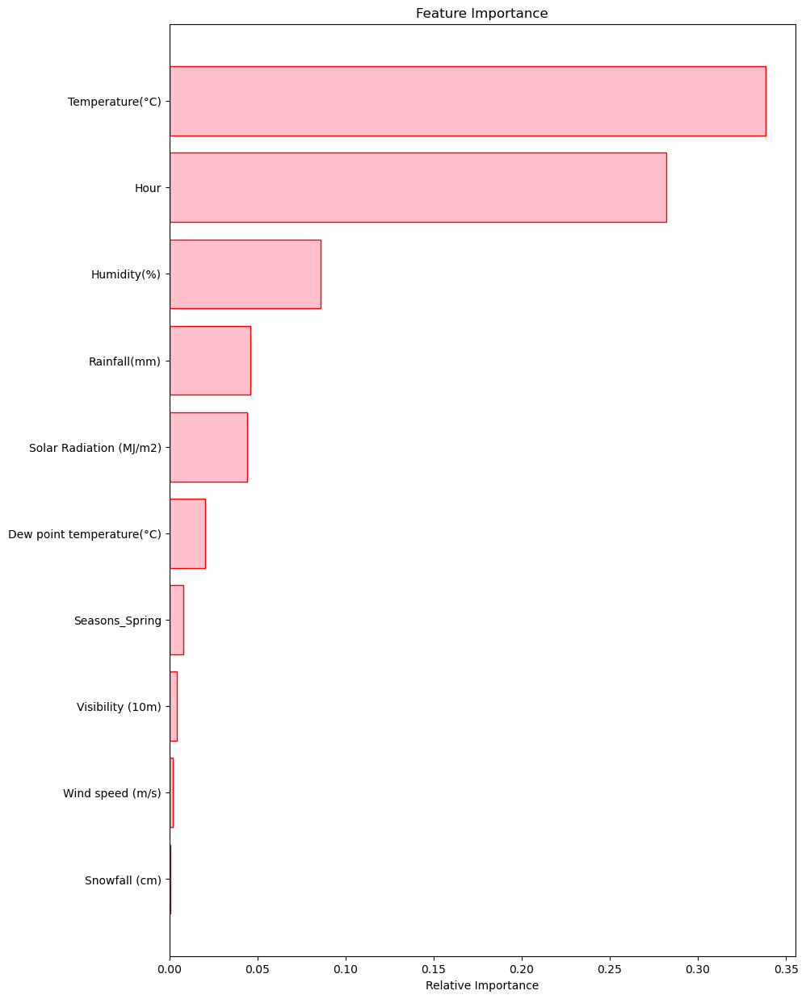



******************** ploting the graph of Actual and predicted only with 80 observation ********************


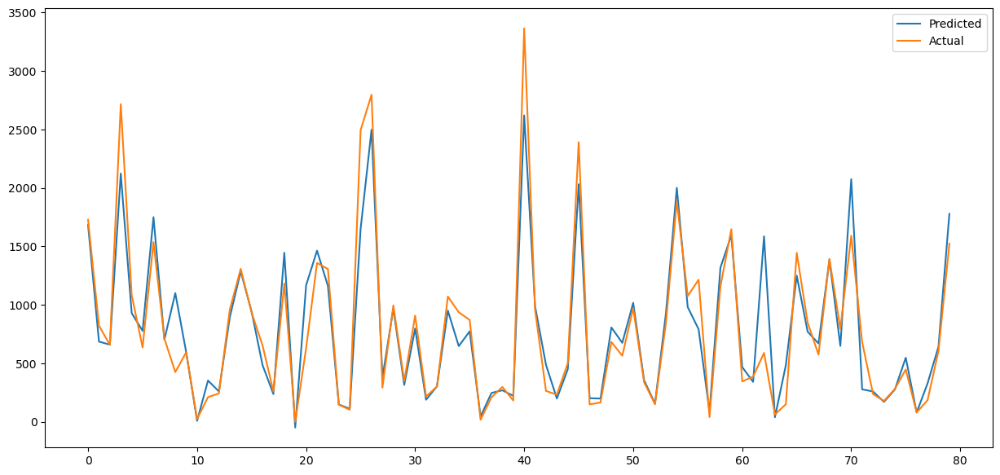

In [101]:
# Using grid search fitting the model with the previously created eval_metrics function 
gradient_boost_grid_search = GridSearchCV(GradientBoostingRegressor(), param_grid=param_grid, n_jobs=-1,cv=5,verbose=2)
eval_metrics(gradient_boost_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

#### Gradient Boosting Regressor Model explainability with LIME

In [102]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(gradient_boost_grid_search.best_estimator_,6,2)

Intercept 265.82452387264914
Prediction_local [1415.11106078]
Right: 403.14277204503986


#### Gradient Boosting Regressor Model explainability with SHAP

In [103]:
# Calling our SHAP function 
model_explainability_shap(gradient_boost_grid_search.best_estimator_,2)

The base value: The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

Red/Blue: Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

#### Gradient Boosting Regressor Model explainability with ELI5

In [104]:
# Calling function model_explainability_eli5
model_explainability_eli5(gradient_boost_grid_search.best_estimator_,5)

The green color shows how much the feature contributes to the prediction of the respective class and the weights are positive for the green color.

The red color has negative weights that indicate the feature isn't contributing to the prediction of that class

### Extreme Gradient Boosting Regressor

In [105]:
params = {
          'subsample': [0.5],#0.3,0.7], 
          'n_thread': [4], #2,6],
          'n_estimators': [1000],#range(200,1500,50), 
          'min_child_weight': [2],#3,5], 
          'max_depth': [4],#range(2,8,2), 
          'learning_rate': [0.02],#0.04,0.06], 
          'eval_mertric': ['rmse'],#'mse',], 
          'colsample_bytree': [0.7],#0.5,1.0],  
          }



[05:21:50] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "eval_mertric", "n_thread", "silent" } are not used.

[05:21:54] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "eval_mertric", "n_thread", "silent" } are not used.

[05:21:58] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "eval_mertric", "n_thread", "silent" } are not used.

[05:22:02] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "eval_mertric", "n_thread", "silent" } are not used.

[05:22:06] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356

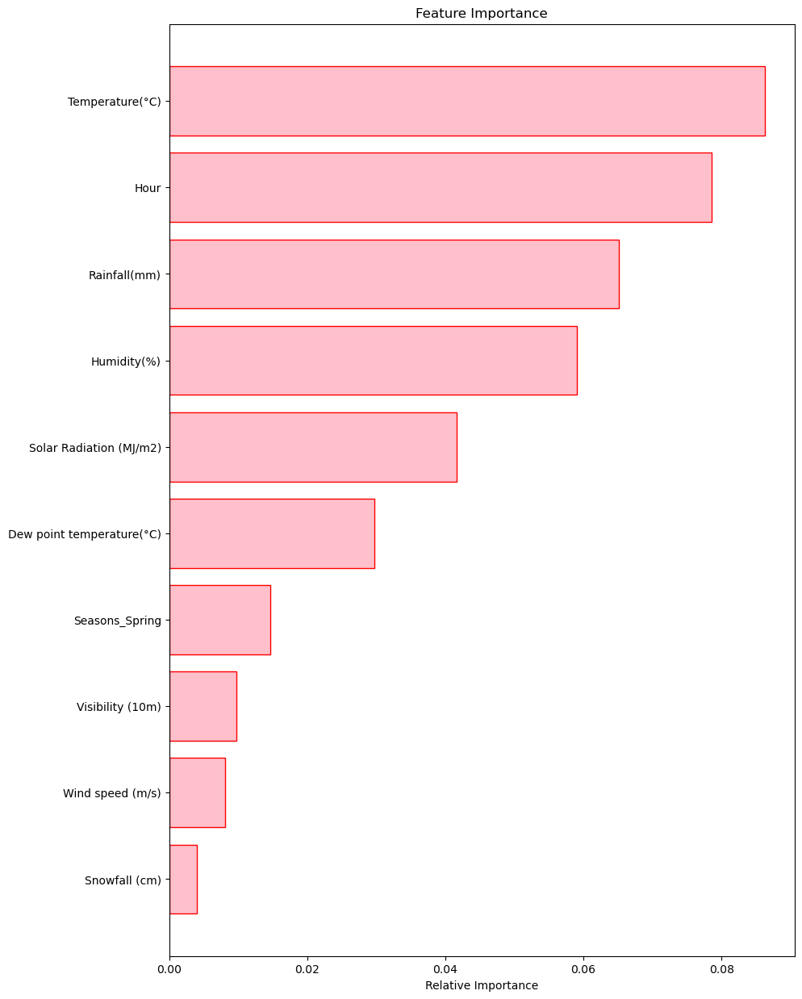



******************** ploting the graph of Actual and predicted only with 80 observation ********************


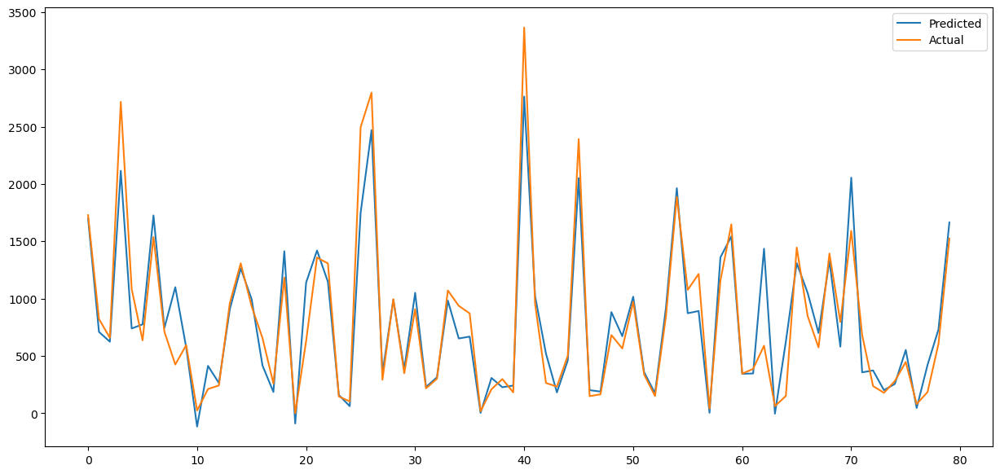

In [106]:
# Creating xgb grid model and fitting the model with the previously created eval_metrics function 

xgb_grid_search= GridSearchCV(XGBRegressor(silent=True),param_grid=params,cv=5)

eval_metrics(xgb_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

#### Extreme Gradient Boosting Regressor Model explainability with LIME

In [107]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(xgb_grid_search.best_estimator_,6,2)

Intercept 84.62142334823125
Prediction_local [1574.57787659]
Right: 443.44995


#### Extreme Gradient Boosting Regressor Model explainability with SHAP

In [108]:
# Calling our SHAP function 
model_explainability_shap(xgb_grid_search.best_estimator_,2)

The base value: The original paper explains that the base value E(y_hat) is “the value that would be predicted if we did not know any features for the current output.” In other words, it is the mean prediction, or mean(yhat).

Red/Blue: Features that push the prediction higher (to the right) are shown in red, and those pushing the prediction lower are in blue.

#### Extreme Gradient Boosting Regressor Model explainability with ELI5

In [109]:
# Calling function model_explainability_eli5
model_explainability_eli5(xgb_grid_search.best_estimator_,2)

The green color shows how much the feature contributes to the prediction of the respective class and the weights are positive for the green color.

The red color has negative weights that indicate the feature isn't contributing to the prediction of that class

### Bagging Regressor

In [110]:
# parameters for Bagging
param_grid = {"n_estimators":[100],#,150,200],
              "bootstrap":["True"],#,"False"],
              'max_samples' :[0.3],#,0.5,0.7,1.0],
              'max_features':[1.0],#0.3,0.5,0.7,]
              }

# After finding the best parameters, we commented on all the other parameters for faster execution

****************************** Training score ******************************
Training score  = 0.9357569385103766


****************************** Best Parameters & Best Score ******************************
The best parameters found out to be :{'bootstrap': 'True', 'max_features': 1.0, 'max_samples': 0.3, 'n_estimators': 100} 
where model best score is:  0.8754566692708355 



****************************** Evalution Metrics ******************************
MAE : 139.2784611872146
MSE : 52046.62287821918
RMSE : 228.1372895390387
R2 : 0.8728091451003092
Adjusted R2 :  0.8712207301686294 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


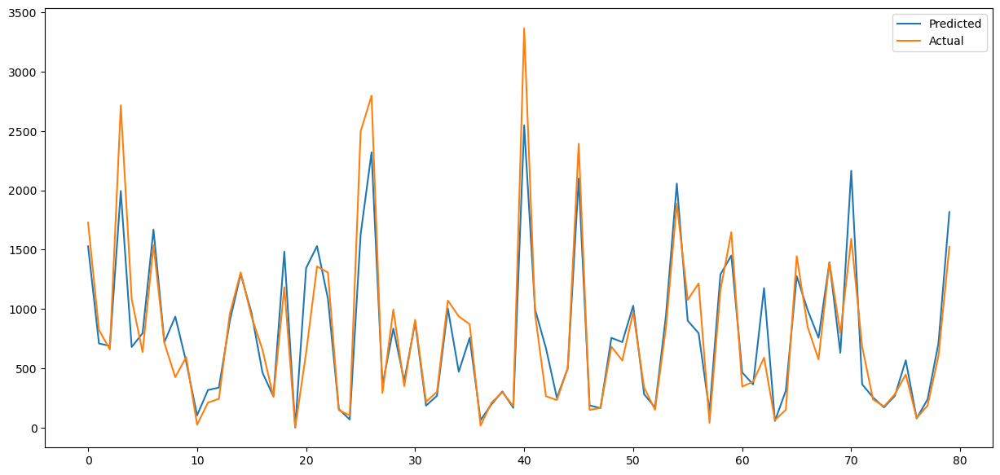

In [111]:
# Using Grid SearchCV and fitting the model with the previously created eval_metrics function
bagging_grid_search = GridSearchCV(BaggingRegressor(),param_grid=param_grid,n_jobs=-1,cv=5)
eval_metrics(bagging_grid_search,X_train_scaled,X_test_scaled,y_train,y_test)

#### Bagging Regressor Model explainability with LIME

In [112]:
# Calling our lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(bagging_grid_search.best_estimator_,6,2)

Intercept 250.7583858244784
Prediction_local [1567.89061561]
Right: 871.8


### Stacking Regressor

In [113]:
# Base Estimators 
estimators = [('dt',dt_grid_search.best_estimator_),('rf',random_forest_grid_search.best_estimator_),
       ('bg',bagging_grid_search.best_estimator_),('xgb',xgb_grid_search.best_estimator_),
       ]

In [114]:
# In Final estimator we use Gradient Boosting Regressor
final_estimator = gradient_boost_grid_search.best_estimator_

****************************** Training score ******************************
Training score  = 0.9514335932597153


****************************** Best Parameters & Best Score ******************************
None


****************************** Evalution Metrics ******************************
MAE : 113.59307170945556
MSE : 36688.12366390536
RMSE : 191.54144111368004
R2 : 0.9103420442014784
Adjusted R2 :  0.9092223565018669 



******************** ploting the graph of Actual and predicted only with 80 observation ********************


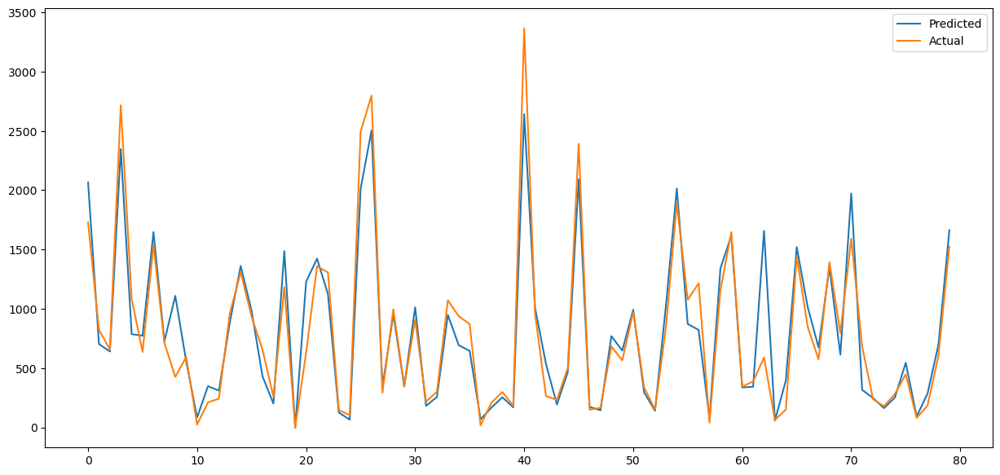

In [115]:
# Creating a variable for StackingRegressor and fitting the model with the previously created eval_metrics function
stacking = StackingRegressor(estimators=estimators,final_estimator=final_estimator,passthrough=True,n_jobs=-1)
eval_metrics(stacking,X_train_scaled,X_test_scaled,y_train,y_test)

#### Stacking Regressor Model explainability with LIME

In [116]:
# Calling lime function and taking only 6 number of feature and 2nd Row
model_explainability_lime(stacking,6,2)

Intercept -1.8567379366977548
Prediction_local [1547.70248899]
Right: 437.7041114463805


### Creating Data Frame of all Regression Evaluation Matrix with respect of models

In [117]:
# Creating dictionary to store all the metrices 
all_metrics = {'Mean_Absolute_error':mean_absolut_error_ht,'Mean_square_error':mean_sq_error_ht,'Root_Mean_square_error':root_mean_sq_error_ht,'Training_score':training_score_ht,'R2':r2_list_ht,'Adjusted_R2':adj_r2_list_ht}

In [118]:
# List of all model name 
model_name=['Linear','Lasso','Ridge','Polynomial','Stochastic Gradient Descent','Decision_Tree','Random_Forest','Bagging','Gradient_Boosting','Extreme Gradient Boosting','Stacking Regressor']

In [119]:
# Converting dictionary to dataframe for simple visualization 
metrics_df_bike_reg = pd.DataFrame.from_dict(all_metrics,orient='index',columns=model_name)
metrics_df_bike_reg = metrics_df_bike_reg.transpose().reset_index().rename(columns={'index':'Models'})

In [120]:
# View the metrics
metrics_df_bike_reg

,Models,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Linear,207.416668,93868.920327,306.380352,0.794813,0.770604,0.765461
1,Lasso,207.483631,93964.528384,306.536341,0.794811,0.770371,0.765223
2,Ridge,207.438415,93898.286675,306.428273,0.794813,0.770533,0.765388
3,Polynomial,132.810739,47668.344624,218.330815,0.925992,0.883509,0.735478
4,Stochastic Gradient Descent,4.245303,30.678381,5.538807,0.793482,0.797296,0.792751
5,Decision_Tree,151.547355,64654.087204,254.271680,0.919458,0.841999,0.840026
6,Random_Forest,139.016929,52419.107773,228.952195,0.924331,0.871899,0.870299
7,Bagging,124.087218,42767.568391,206.803212,0.922416,0.895485,0.894180
8,Gradient_Boosting,134.948098,44899.110293,211.894102,0.927606,0.890276,0.888906
9,Extreme Gradient Boosting,139.278461,52046.622878,228.137290,0.935757,0.872809,0.871221


In [121]:
# Sort matrices_df in Descending order to view which model have the best score
metrics_df_bike_reg=metrics_df_bike_reg.sort_values("Adjusted_R2",ascending=False).reset_index(drop=True)
metrics_df_bike_reg

,Models,Mean_Absolute_error,Mean_square_error,Root_Mean_square_error,Training_score,R2,Adjusted_R2
0,Stacking Regressor,113.593072,36688.123664,191.541441,0.951434,0.910342,0.909222
1,Bagging,124.087218,42767.568391,206.803212,0.922416,0.895485,0.894180
2,Gradient_Boosting,134.948098,44899.110293,211.894102,0.927606,0.890276,0.888906
3,Extreme Gradient Boosting,139.278461,52046.622878,228.137290,0.935757,0.872809,0.871221
4,Random_Forest,139.016929,52419.107773,228.952195,0.924331,0.871899,0.870299
5,Decision_Tree,151.547355,64654.087204,254.271680,0.919458,0.841999,0.840026
6,Stochastic Gradient Descent,4.245303,30.678381,5.538807,0.793482,0.797296,0.792751
7,Linear,207.416668,93868.920327,306.380352,0.794813,0.770604,0.765461
8,Ridge,207.438415,93898.286675,306.428273,0.794813,0.770533,0.765388
9,Lasso,207.483631,93964.528384,306.536341,0.794811,0.770371,0.765223


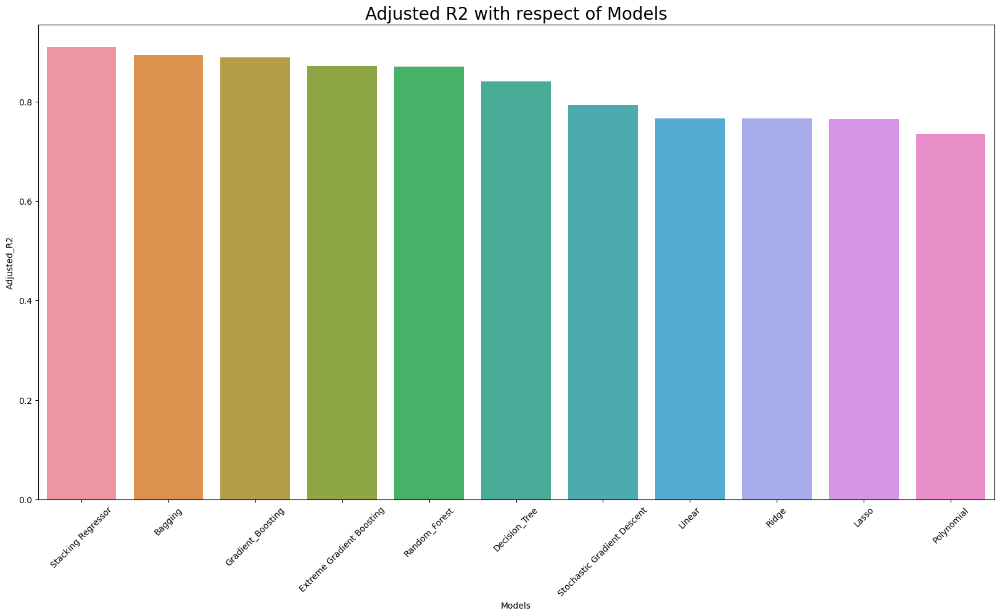

In [122]:
#Visulaizing the Adjusted R2 for all models
plt.figure(figsize=(20,10))
sns.barplot(metrics_df_bike_reg['Models'],metrics_df_bike_reg['Adjusted_R2'])
plt.title("Adjusted R2 with respect of Models",fontsize=20)
plt.xticks(rotation= 45)
plt.show()

### Regression & Ensemble - Observations/Conclusion:

1. Bike rental count is high during week days then weekend days.

2. The rental bike counts is at its peek at 8 AM in the morning and 6pm in the evening, We can see an increasing trend from 5am to 8 am, the graph touches the peak at 8am and then there is dip in the graph. Later we can see a gradual increase in the demand until 6pm, the demand is highest at 6 pm, and reduces there after until midnight,

3. People prefer to rent bikes at moderate to high tempreture, and even when it is little windy, it is observed that highest bike rental count is in Autumn and summer seasons and the lowest is in winter season.

4. Bike rentals is highest during the clear days and lowest on snowy and rainy days.

#### Evaluation Metrics - Since the problem is a multiclass classification problem with imbalanaced data set, therefore we have gone ahead with precision, recall and f1-score as our evaluation metric.

1. Mean Absolute Error (MAE): MAE is a very simple metric which calculates the absolute difference between actual and predicted values.

2. Mean Square Error (MSE):	MSE is a most used and very simple metric with a little bit of change in mean absolute error. Mean squared error states that finding the squared difference between actual and predicted value.

3. Root Mean Square Error (RMSE): As RMSE is clear by the name itself, that it is a simple square root of mean squared error.

4. Training Score: How the model generalized or fitted in the training data. If the model fits so well in a data with lots of variance then this causes over-fitting. This causes poor result on Test Score. Because the model curved a lot to fit the training data and generalized very poorly. So, generalization is the goal.

5. R2: R2 score is a metric that tells the performance of your model, not the loss in an absolute sense that how many wells did your model perform. 

6. Adjusted R2: The disadvantage of the R2 score is while adding new features in data the R2 score starts increasing or remains constant but it never decreases because It assumes that while adding more data variance of data increases.

#### When compared the RMSE and Adjusted R2 of all the models, Stacking Regressor gives the highest Score where Adjusted R2 score is 0.90 and Training score is 0.95 so this model is the best for predicting the bike rental count on daily basis.